# Color Visualization Notebook -  HSV Test Plots

# HSV Training and Testing Plot

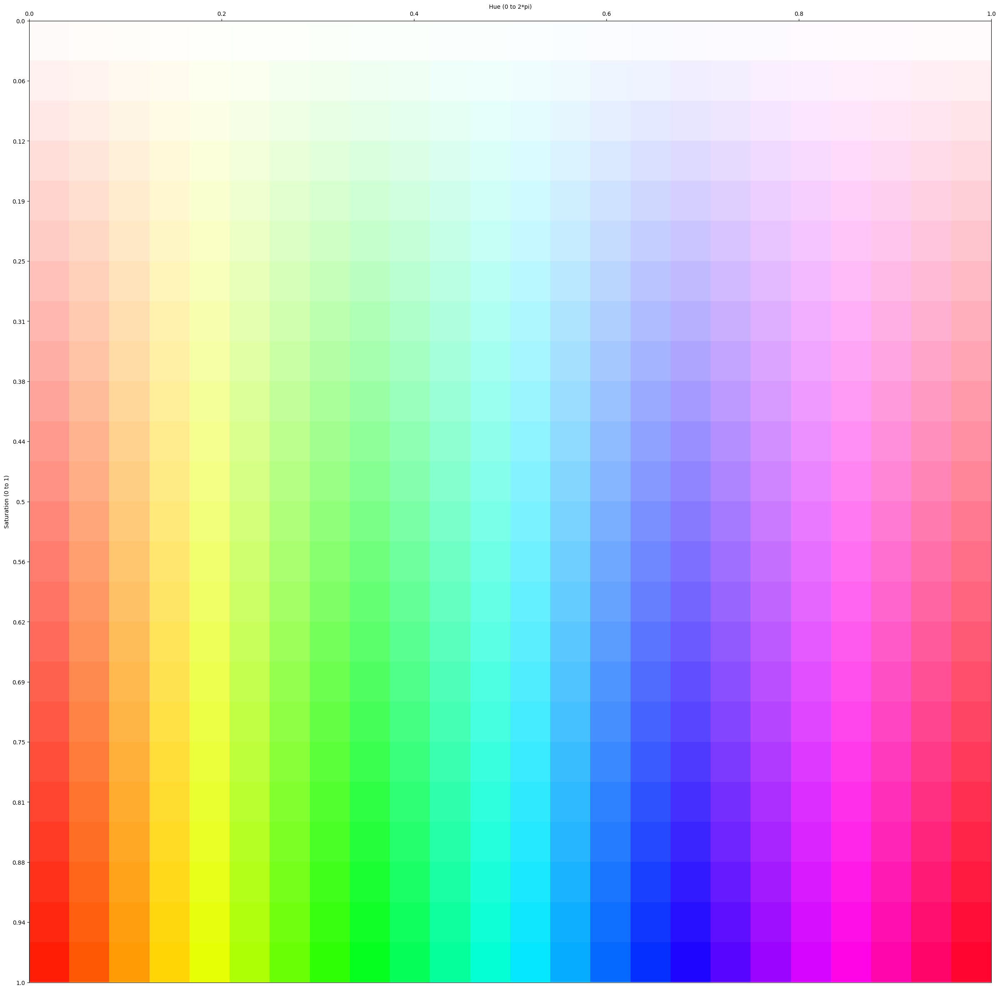

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set block size for 24*24 grid
block_size = 24

# Create an HSV image with original size
img_hsv = np.zeros((256, 256, 3), dtype=np.uint8)

# Generate Hue and Saturation gradients
for x in range(256):
    for y in range(256):
        hue = int(x * 179 / 255)  # Scale x to 0-179 for hue
        img_hsv[y, x] = (hue, y, 255)  # Set Hue and Saturation
        img_hsv[y, x] = (hue, 255 - y, 255)  # Set Hue and Saturation


# Resize the HSV image to 30x30 blocks
img_hsv_small = cv2.resize(img_hsv, (block_size, block_size), interpolation=cv2.INTER_AREA)

# Convert to RGB for display
img_rgb_small = cv2.cvtColor(img_hsv_small, cv2.COLOR_HSV2RGB)

# Display the discretized image
plt.figure(figsize=(30, 30))
plt.imshow(img_rgb_small, extent=(0, 1, 0, 1), origin='lower')  # Set origin='lower'

# Configure plot labels and ticks
plt.xlabel('Hue (0 to 2*pi)')
plt.ylabel('Saturation (0 to 1)')
plt.gca().xaxis.set_label_position('top')

# Set x and y ticks with finer intervals for more tick marks
num_ticks = 17  # Number of ticks for finer detail
#tick_values = np.linspace(0, 2*np.pi, num_ticks)
#plt.xticks(tick_values, np.round(tick_values, 2))
tick_values = np.linspace(0, 1, num_ticks)
plt.yticks(tick_values, np.round(1-tick_values, 2))

# Set tick parameters for appearance
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)

plt.show()


## Making an HSV Test Plot

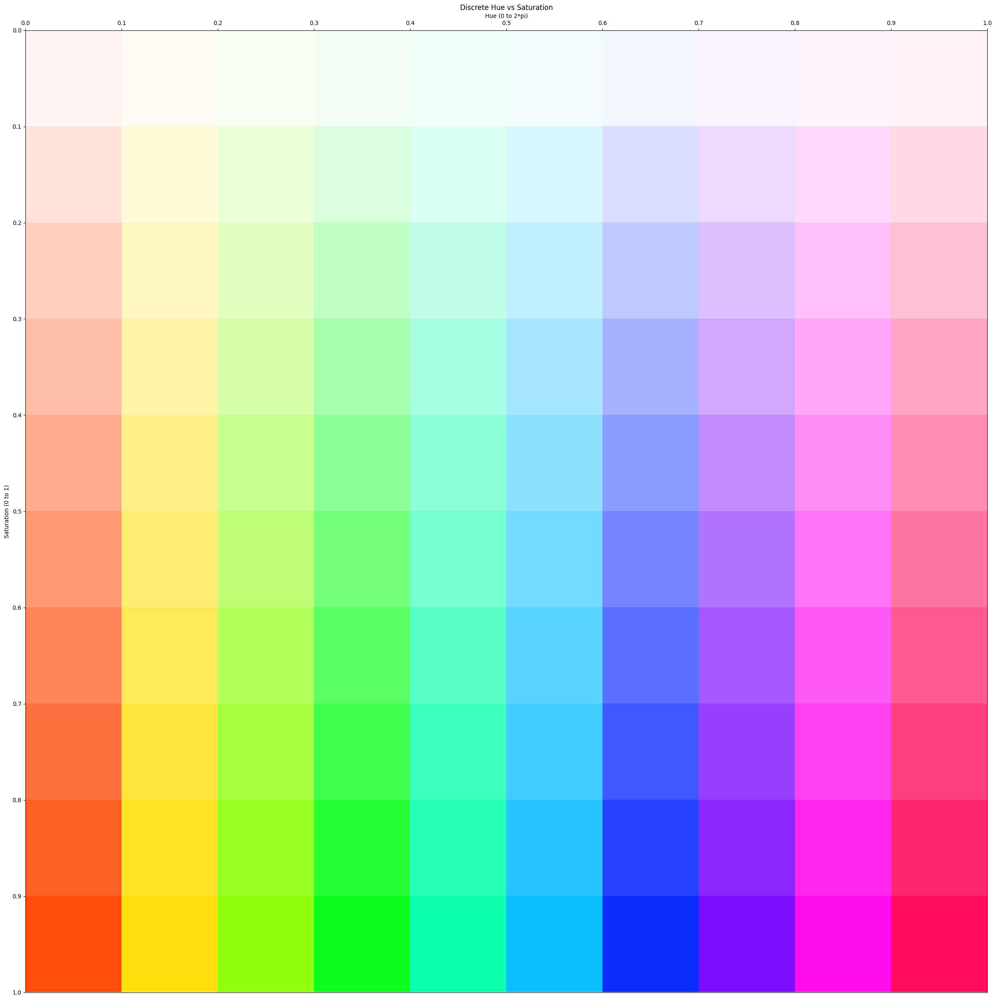

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set block size for 30x30 grid
block_size = 10

# Create an HSV image with original size
img_hsv = np.zeros((256, 256, 3), dtype=np.uint8)

# Generate Hue and Saturation gradients
for x in range(256):
    for y in range(256):
        hue = int(x * 179 / 255)  # Scale x to 0-179 for hue
        img_hsv[y, x] = (hue, y, 255)  # Set Hue and Saturation
        img_hsv[y, x] = (hue, 255 - y, 255)  # Set Hue and Saturation


# Resize the HSV image to 30x30 blocks
img_hsv_small = cv2.resize(img_hsv, (block_size, block_size), interpolation=cv2.INTER_AREA)

# Convert to RGB for display
img_rgb_small = cv2.cvtColor(img_hsv_small, cv2.COLOR_HSV2RGB)

# Display the discretized image
plt.figure(figsize=(30, 30))
plt.title('Discrete Hue vs Saturation')
plt.imshow(img_rgb_small, extent=(0, 1, 0, 1), origin='lower')  # Set origin='lower'

# Configure plot labels and ticks
plt.xlabel('Hue (0 to 2*pi)')
plt.ylabel('Saturation (0 to 1)')
plt.gca().xaxis.set_label_position('top')

# Set x and y ticks with finer intervals for more tick marks
num_ticks = 11  # Number of ticks for finer detail
tick_values = np.linspace(0, 1, num_ticks)
plt.xticks(tick_values, np.round(tick_values, 2))
tick_values = np.linspace(0, 1, num_ticks)
plt.yticks(tick_values, np.round(1-tick_values, 2))

# Set tick parameters for appearance
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)

plt.show()


# Saturation Racer

(np.float64(0.3), np.float64(1.0), np.float64(0.0), np.float64(2.0))

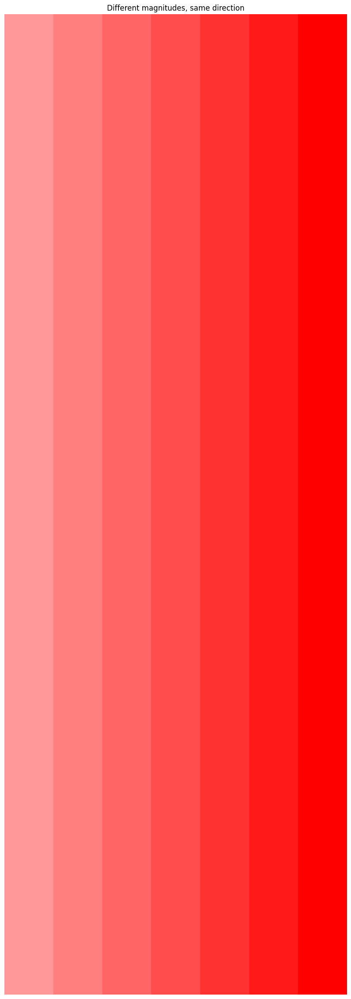

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 800
x, y = np.meshgrid(np.linspace(0, 1, image_pts), np.linspace(0, 1, image_pts))

values = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
magnitude_gradient = np.tile(np.repeat(values, image_pts/10), (image_pts, 1))

 

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = 0  # Hue channel represents direction
img_hsv[:, :, 1] = img_hsv[:, :, 1] = (magnitude_gradient * 255) #.astype(np.uint8) # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the discretized image
plt.figure(figsize=(10, 80))
plt.title('Discrete Hue vs Saturation')
plt.imshow(img_rgb, origin='lower', extent=[0, 1, 0, 2])
#plt.xlabel('X')
#plt.ylabel('Y')
plt.title('Different magnitudes, same direction')
plt.xlim(0.3, 1)
plt.axis('off')



# VORTEX -  from 0.3 - 1 in saturation.

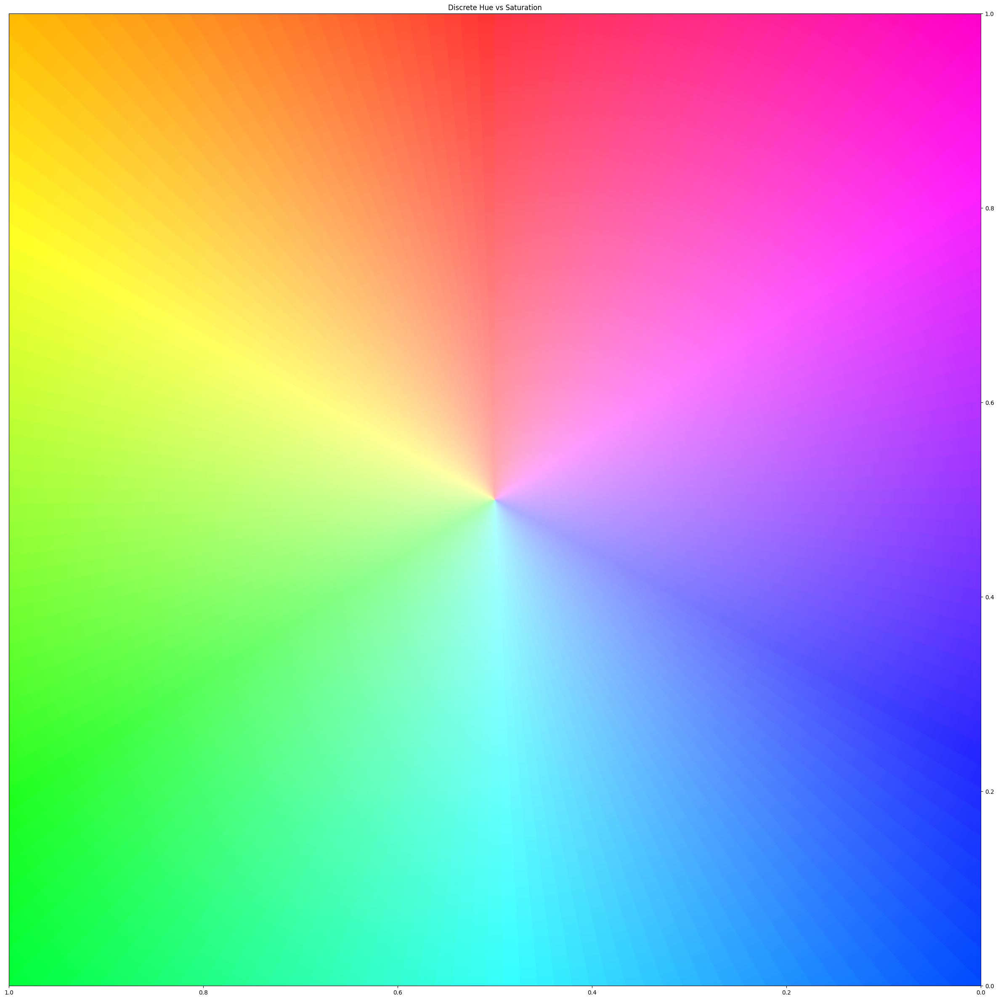

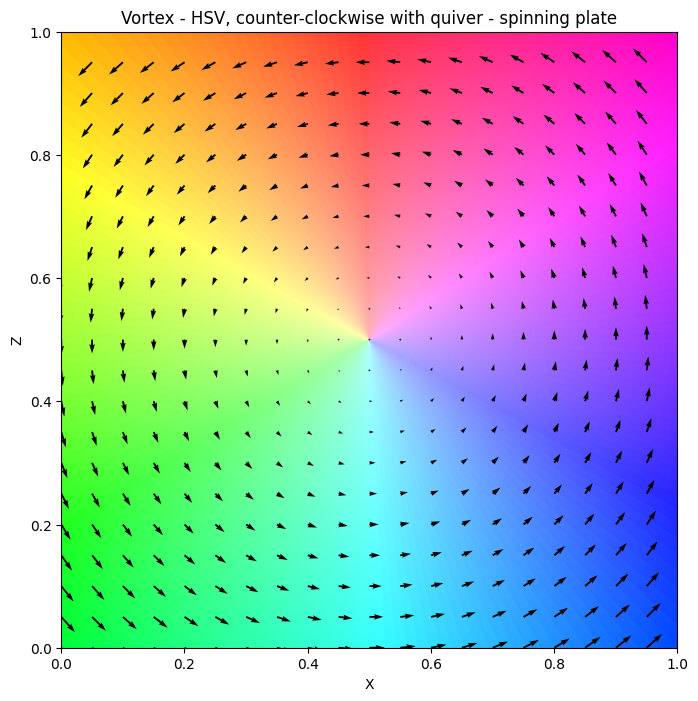

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = -r * np.sin(theta) #/ r
    v = r * np.cos(theta) #/ r
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2000
x, y = np.meshgrid(np.linspace(0, 1, image_pts), np.linspace(0, 1, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.50, 0.50
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(30, 30))
plt.title('Discrete Hue vs Saturation')
#plt.xlabel('X')
#plt.ylabel('Z')
#plt.title('Vortex - HSV, counter-clockwise - spinning plate')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[1, 0, 0, 1])
#plt.xticks([0, 1/3, 2/3, 1]) 






# Plot the quiver plot
# Invert the x-axis
max_val = 2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 100
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Vortex - HSV, counter-clockwise with quiver - spinning plate')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[0, 1, 0, 1])





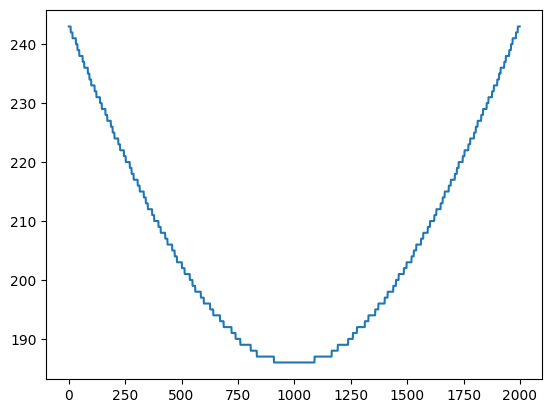

In [4]:
plt.plot(magnitude_scaled[:][128])


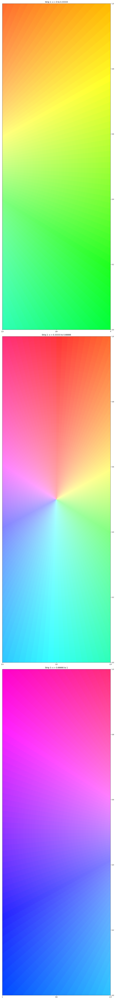

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = -r * np.sin(theta) #/ r
    v = r * np.cos(theta) #/ r
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 4000
x, y = np.meshgrid(np.linspace(0, 1, image_pts), np.linspace(0, 1, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.50, 0.50
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # 0 to 0.33333
strip2 = img_rgb[:, strip_width:2*strip_width]  # 0.33333 to 0.66666
strip3 = img_rgb[:, 2*strip_width:]  # 0.66666 to 1

# Create figure with three subplots arranged vertically (height = 3x width)
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (0 - 0.33333)
ax1.imshow(strip1, origin='lower', extent=[1/3, 0, 0, 1])
ax1.set_title('Strip 1: x = 0 to 0.33333')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (0.33333 - 0.66666)
ax2.imshow(strip2, origin='lower', extent=[2/3, 1/3, 0, 1])
ax2.set_title('Strip 2: x = 0.33333 to 0.66666')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (0.66666 - 1)
ax3.imshow(strip3, origin='lower', extent=[1, 2/3, 0, 1])
ax3.set_title('Strip 3: x = 0.66666 to 1')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

# For ax1:
ax1.set_xticks([0, 1/6, 1/3])
ax1.set_xticklabels(['1/3', '1/6', '0'])

# For ax2:
ax2.set_xticks([1/3, 1/2, 2/3])
ax2.set_xticklabels(['2/3', '1/2', '1/3'])

# For ax3:
ax3.set_xticks([2/3, 5/6, 1])
ax3.set_xticklabels(['1', '5/6', '2/3'])


plt.tight_layout()
plt.show()



# Sinking Vortex w/ 0.3 in middle

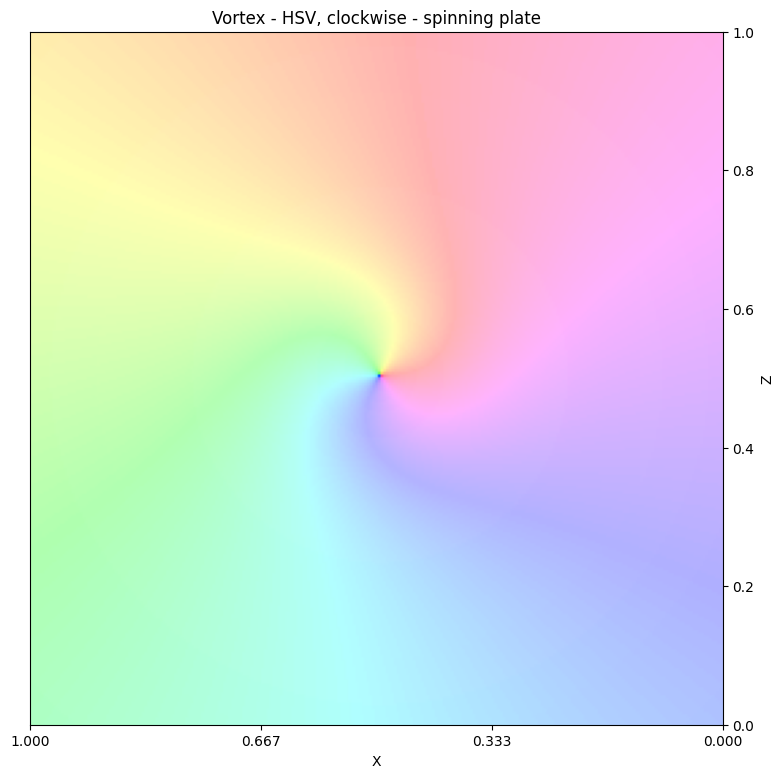

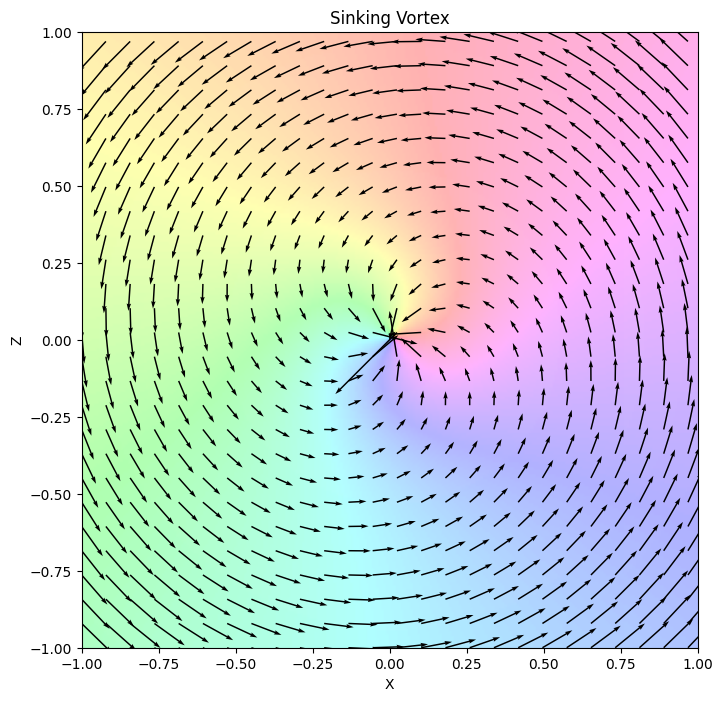

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-5  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = -r * np.sin(theta) #/ r
    v = r * np.cos(theta) #/ r

    # Calculating A sink
    x_centre = x - center_x
    y_centre = y - center_y
    r2 = np.sqrt(x_centre**2 + y_centre**2)
    r2 = np.where(r == 0, 1e-6, r2)

    # spring source
    u1 = -x_centre / r2**2
    v1 = -y_centre / r2**2

    u = u + 0.1*u1
    v = v + 0.1*v1
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 255
x, y = np.meshgrid(np.linspace(-1, 1, image_pts), np.linspace(-1, 1, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(9, 9))
plt.title('Sinking Vortex')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Vortex - HSV, clockwise - spinning plate')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[1, 0, 0, 1])
plt.xticks([0, 1/3, 2/3, 1]) 



# Plot the quiver plot
# Invert the x-axis
max_val = 2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 10
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Sinking Vortex')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[-1, 1, -1, 1])





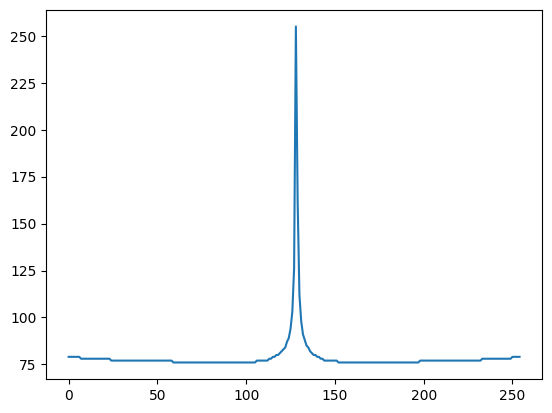

In [8]:
plt.plot(magnitude_scaled[:][128])


### Distributed broad peak

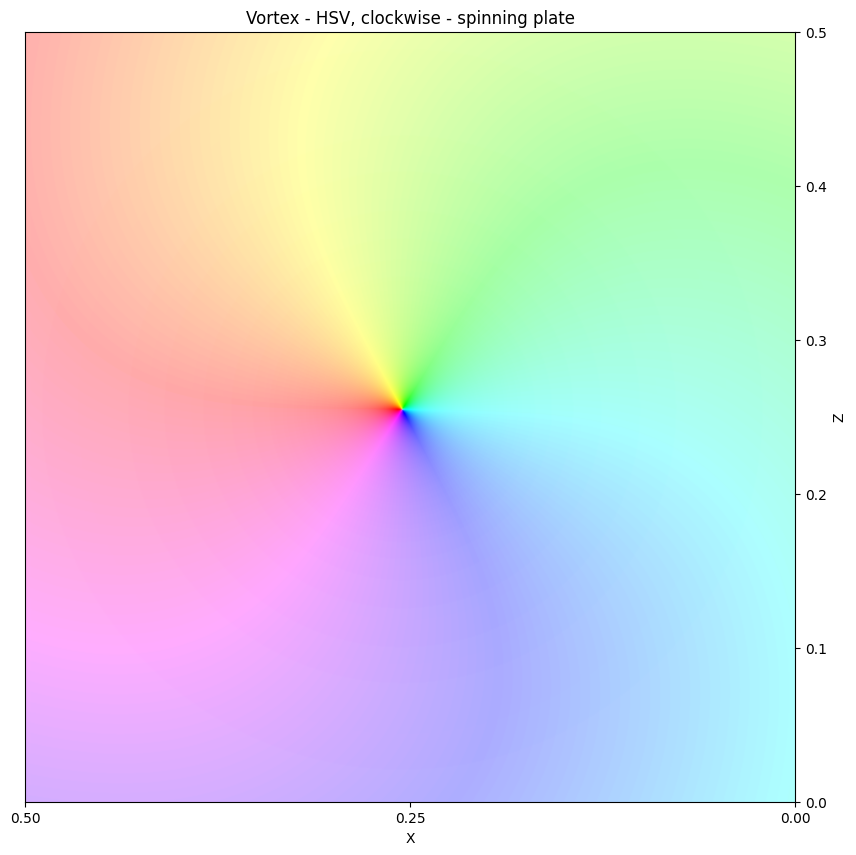

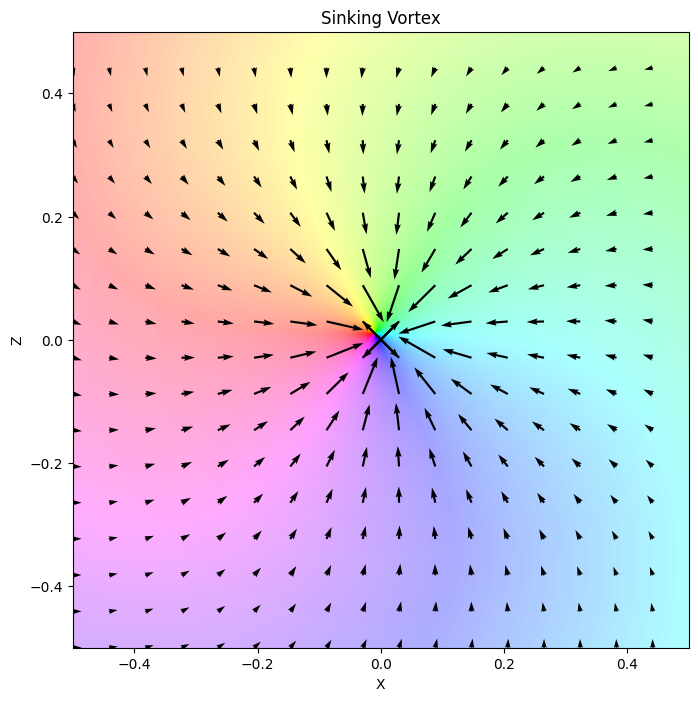

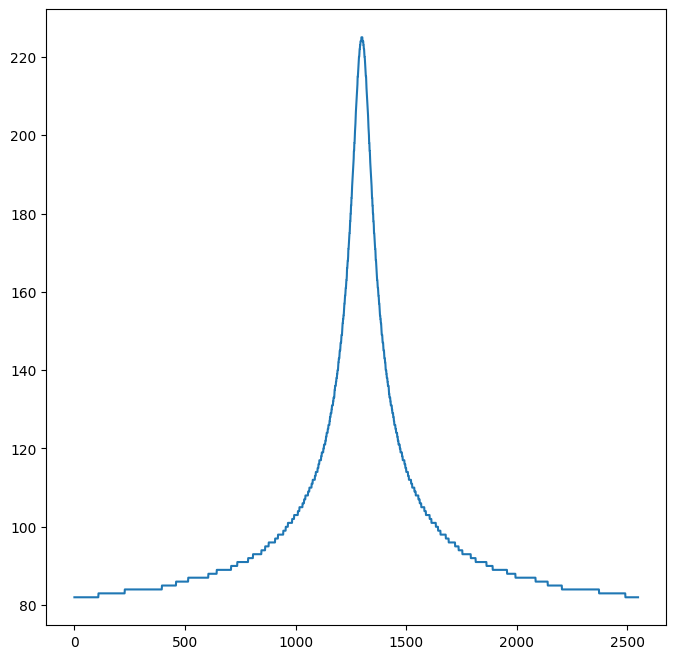

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = - np.sin(theta) * r**2
    v =   np.cos(theta) * r**2

    # Calculating A sink
    x_centre = x - center_x
    y_centre = y - center_y
    r2 = np.sqrt(x_centre**2 + y_centre**2) + 5*1e-3

    # Sink
    u1 = -x_centre / r2**2
    v1 = -y_centre / r2**2

    u = 0.4*u + .15*u1
    v = 0.4*v + .15*v1
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)
img_rgb = img_rgb[:, ::-1]  # This also flips horizontally



# Display the resulting image
plt.figure(figsize=(10, 10))
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Vortex - HSV, clockwise - spinning plate')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[edge_tick, 0, 0, edge_tick])
plt.xticks([0, edge_tick/2, edge_tick]) 



# Plot the quiver plot
# Invert the x-axis
max_val = 1.2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction


u_clipped_flipped = np.fliplr(u_clipped)  # Flip the u field horizontally
v_clipped_flipped = np.fliplr(v_clipped)  # Flip the v field horizontally

skip = 150
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Sinking Vortex')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick,-edge_tick, edge_tick])

plt.figure(figsize=(8, 8))

plt.plot(magnitude_scaled[:][1270])



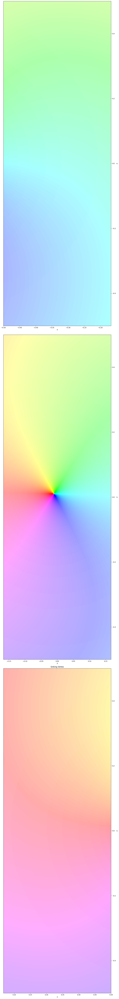

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # left third
strip2 = img_rgb[:, strip_width:2*strip_width]  # middle third
strip3 = img_rgb[:, 2*strip_width:]  # right third

# Create figure with three subplots arranged vertically
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (left third: -0.5 to -0.167)
ax1.imshow(strip1, origin='lower', extent=[-edge_tick/3, -edge_tick, -edge_tick, edge_tick])
ax1.set_xlabel('X')
ax1.set_ylabel('Z')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (middle third: -0.167 to 0.167)
ax2.imshow(strip2, origin='lower', extent=[edge_tick/3, -edge_tick/3, -edge_tick, edge_tick])
ax2.set_xlabel('X')
ax2.set_ylabel('Z')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (right third: 0.167 to 0.5)
ax3.imshow(strip3, origin='lower', extent=[edge_tick, edge_tick/3, -edge_tick, edge_tick])
ax3.set_xlabel('X')
ax3.set_ylabel('Z')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

plt.title('Sinking Vortex')
plt.tight_layout()
plt.show()

# Spewing Vortex w/ 0.3 in middle

### Distributed broad peak

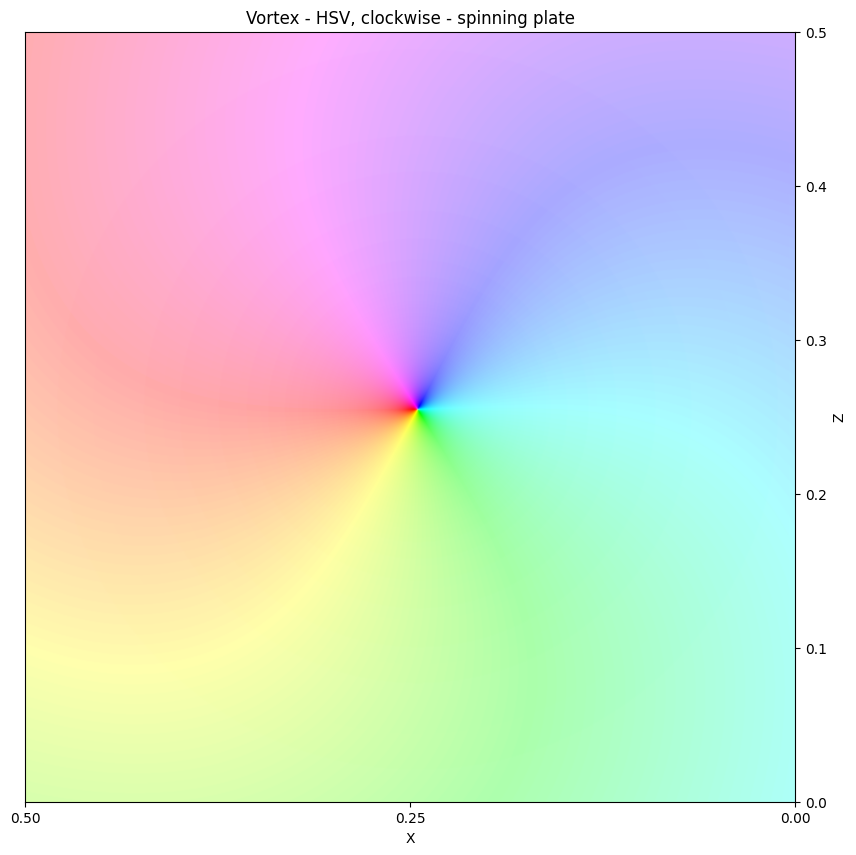

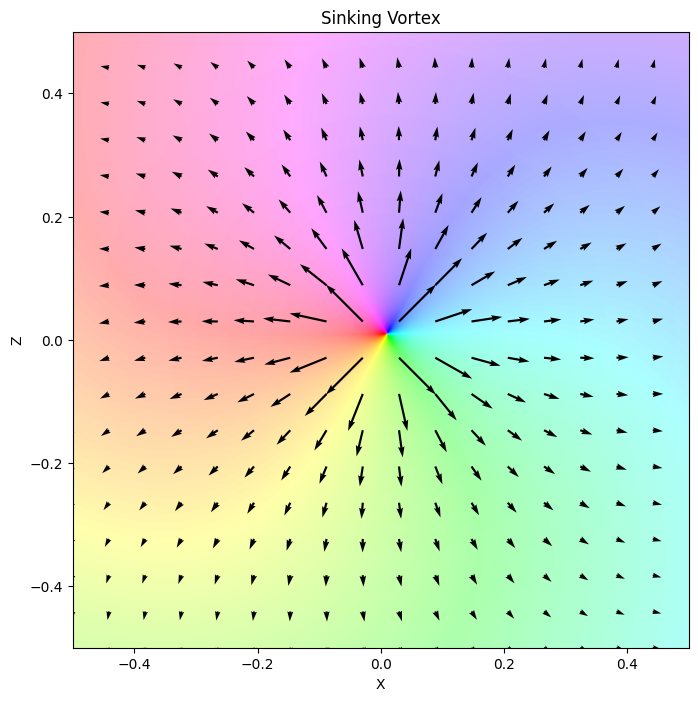

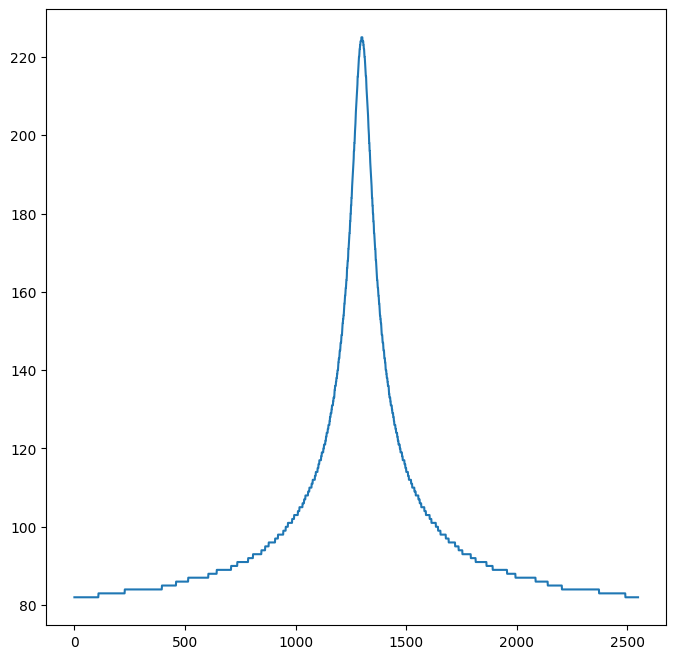

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = - np.sin(theta) * r**2
    v =   np.cos(theta) * r**2

    # Calculating A sink
    x_centre = x - center_x
    y_centre = y - center_y
    r2 = np.sqrt(x_centre**2 + y_centre**2) + 5*1e-3

    # Sink
    u1 = -x_centre / r2**2
    v1 = -y_centre / r2**2

    u = 0.4*u - .15*u1
    v = 0.4*v - .15*v1
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(10, 10))
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Vortex - HSV, clockwise - spinning plate')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[edge_tick, 0, 0, edge_tick])
plt.xticks([0, edge_tick/2, edge_tick]) 



# Plot the quiver plot
# Invert the x-axis
max_val = 1.2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 150
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Sinking Vortex')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick,-edge_tick, edge_tick])

plt.figure(figsize=(8, 8))

plt.plot(magnitude_scaled[:][1270])



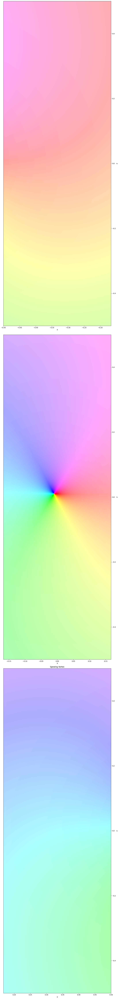

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # left third
strip2 = img_rgb[:, strip_width:2*strip_width]  # middle third
strip3 = img_rgb[:, 2*strip_width:]  # right third

# Create figure with three subplots arranged vertically
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (left third: -0.5 to -0.167)
ax1.imshow(strip1, origin='lower', extent=[-edge_tick/3, -edge_tick, -edge_tick, edge_tick])
ax1.set_xlabel('X')
ax1.set_ylabel('Z')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (middle third: -0.167 to 0.167)
ax2.imshow(strip2, origin='lower', extent=[edge_tick/3, -edge_tick/3, -edge_tick, edge_tick])
ax2.set_xlabel('X')
ax2.set_ylabel('Z')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (right third: 0.167 to 0.5)
ax3.imshow(strip3, origin='lower', extent=[edge_tick, edge_tick/3, -edge_tick, edge_tick])
ax3.set_xlabel('X')
ax3.set_ylabel('Z')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

plt.title('Spewing Vortex')
plt.tight_layout()
plt.show()

# Source

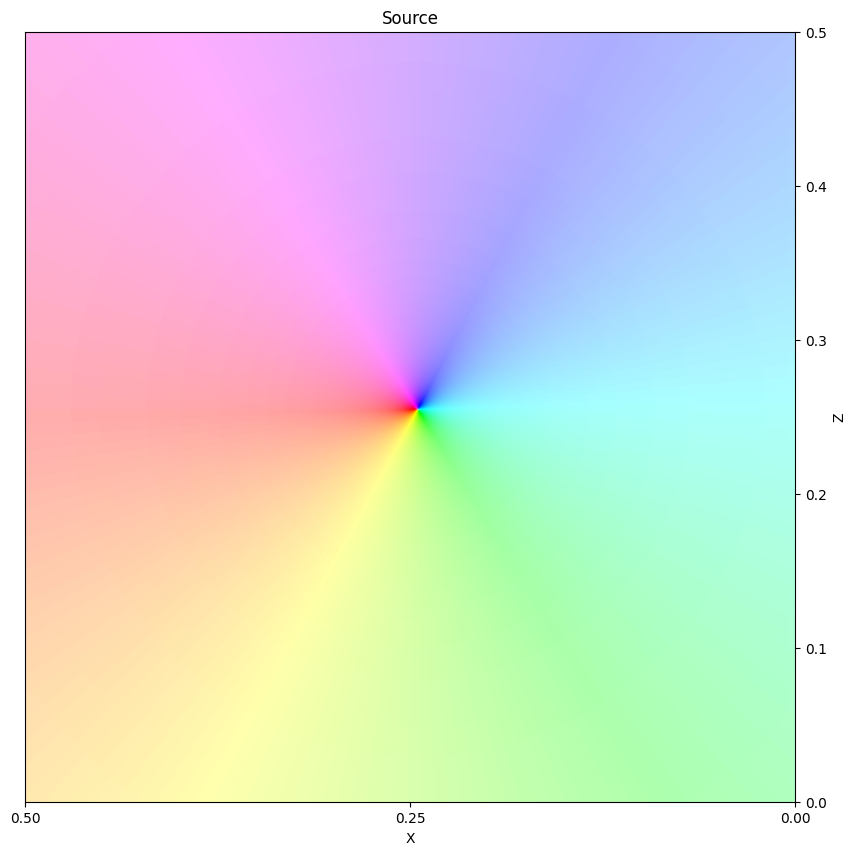

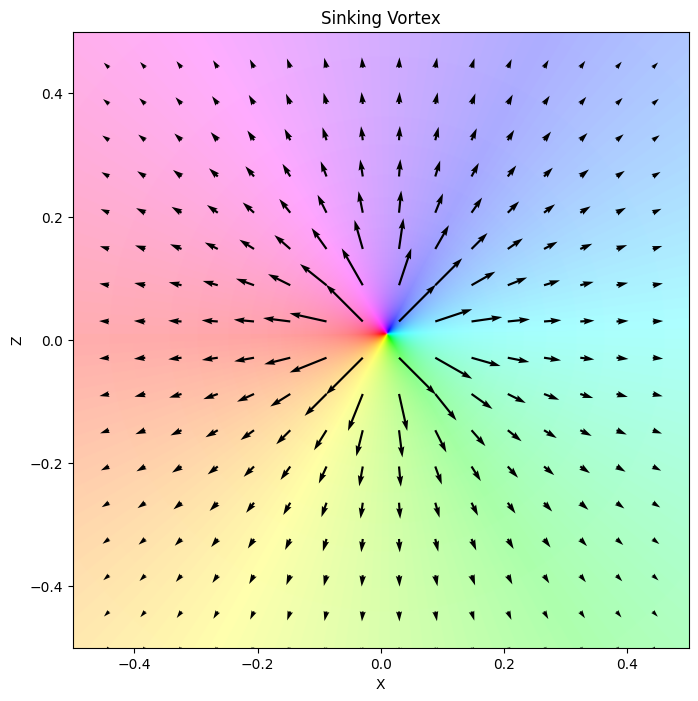

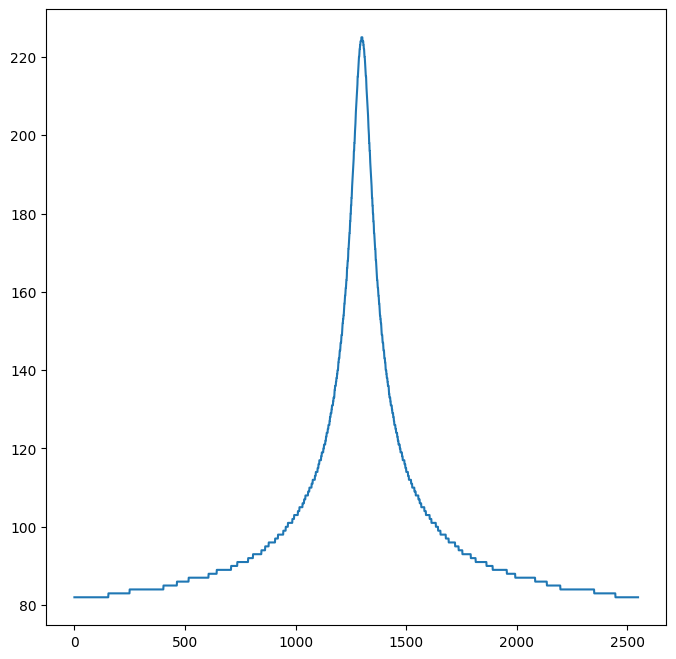

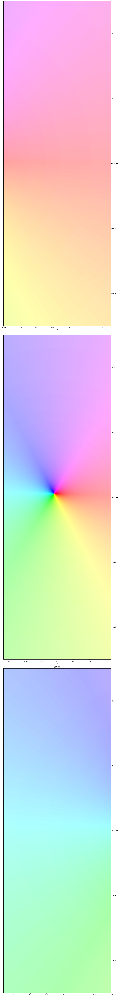

In [19]:
# Spewing Vortex w/ 0.3 in middle
### Distributed broad peak
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = - np.sin(theta) * r**2
    v =   np.cos(theta) * r**2

    # Calculating A sink
    x_centre = x - center_x
    y_centre = y - center_y
    r2 = np.sqrt(x_centre**2 + y_centre**2) + 5*1e-3

    # Sink
    u1 = -x_centre / r2**2
    v1 = -y_centre / r2**2

    u = 0.0*u - .15*u1
    v = 0.0*v - .15*v1
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(10, 10))
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Source')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[edge_tick, 0, 0, edge_tick])
plt.xticks([0, edge_tick/2, edge_tick]) 



# Plot the quiver plot
# Invert the x-axis
max_val = 1.2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 150
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Sinking Vortex')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick,-edge_tick, edge_tick])

plt.figure(figsize=(8, 8))

plt.plot(magnitude_scaled[:][1270])


import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # left third
strip2 = img_rgb[:, strip_width:2*strip_width]  # middle third
strip3 = img_rgb[:, 2*strip_width:]  # right third

# Create figure with three subplots arranged vertically
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (left third: -0.5 to -0.167)
ax1.imshow(strip1, origin='lower', extent=[-edge_tick/3, -edge_tick, -edge_tick, edge_tick])
ax1.set_xlabel('X')
ax1.set_ylabel('Z')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (middle third: -0.167 to 0.167)
ax2.imshow(strip2, origin='lower', extent=[edge_tick/3, -edge_tick/3, -edge_tick, edge_tick])
ax2.set_xlabel('X')
ax2.set_ylabel('Z')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (right third: 0.167 to 0.5)
ax3.imshow(strip3, origin='lower', extent=[edge_tick, edge_tick/3, -edge_tick, edge_tick])
ax3.set_xlabel('X')
ax3.set_ylabel('Z')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

plt.title('Source')
plt.tight_layout()
plt.show()

# Sink

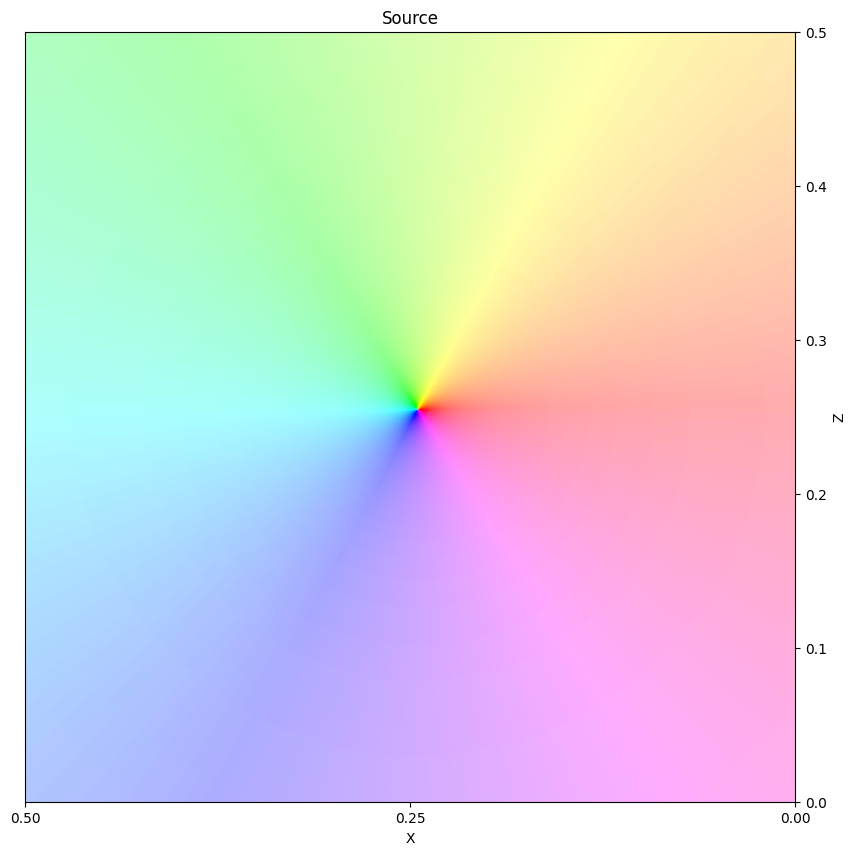

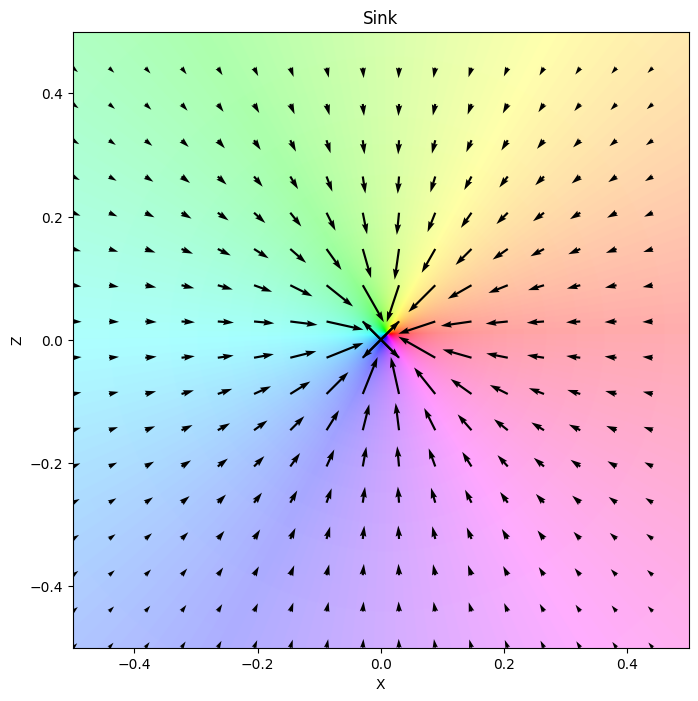

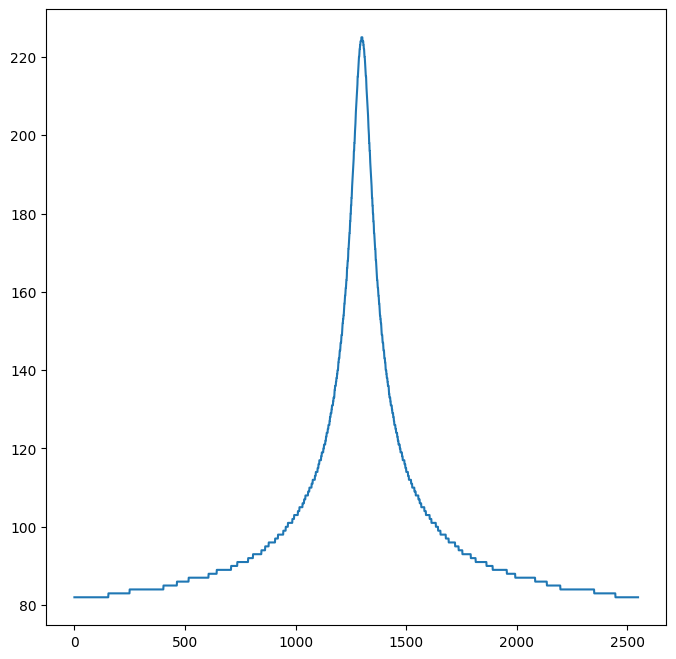

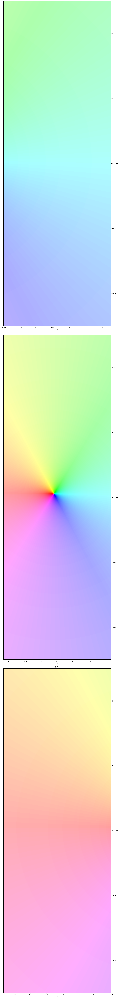

In [21]:
# Spewing Vortex w/ 0.3 in middle
### Distributed broad peak
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = - np.sin(theta) * r**2
    v =   np.cos(theta) * r**2

    # Calculating A sink
    x_centre = x - center_x
    y_centre = y - center_y
    r2 = np.sqrt(x_centre**2 + y_centre**2) + 5*1e-3

    # Sink
    u1 = -x_centre / r2**2
    v1 = -y_centre / r2**2

    u = 0.0*u + .15*u1
    v = 0.0*v + .15*v1
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(10, 10))
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Source')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[edge_tick, 0, 0, edge_tick])
plt.xticks([0, edge_tick/2, edge_tick]) 



# Plot the quiver plot
# Invert the x-axis
max_val = 1.2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 150
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Sink')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick,-edge_tick, edge_tick])

plt.figure(figsize=(8, 8))

plt.plot(magnitude_scaled[:][1270])


import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.01, 0.01
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # left third
strip2 = img_rgb[:, strip_width:2*strip_width]  # middle third
strip3 = img_rgb[:, 2*strip_width:]  # right third

# Create figure with three subplots arranged vertically
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (left third: -0.5 to -0.167)
ax1.imshow(strip1, origin='lower', extent=[-edge_tick/3, -edge_tick, -edge_tick, edge_tick])
ax1.set_xlabel('X')
ax1.set_ylabel('Z')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (middle third: -0.167 to 0.167)
ax2.imshow(strip2, origin='lower', extent=[edge_tick/3, -edge_tick/3, -edge_tick, edge_tick])
ax2.set_xlabel('X')
ax2.set_ylabel('Z')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (right third: 0.167 to 0.5)
ax3.imshow(strip3, origin='lower', extent=[edge_tick, edge_tick/3, -edge_tick, edge_tick])
ax3.set_xlabel('X')
ax3.set_ylabel('Z')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

plt.title('Sink')
plt.tight_layout()
plt.show()

# Saddle

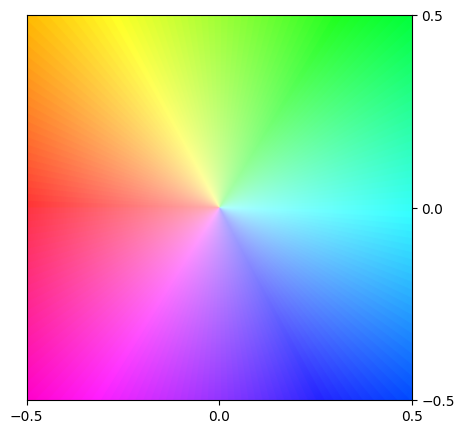

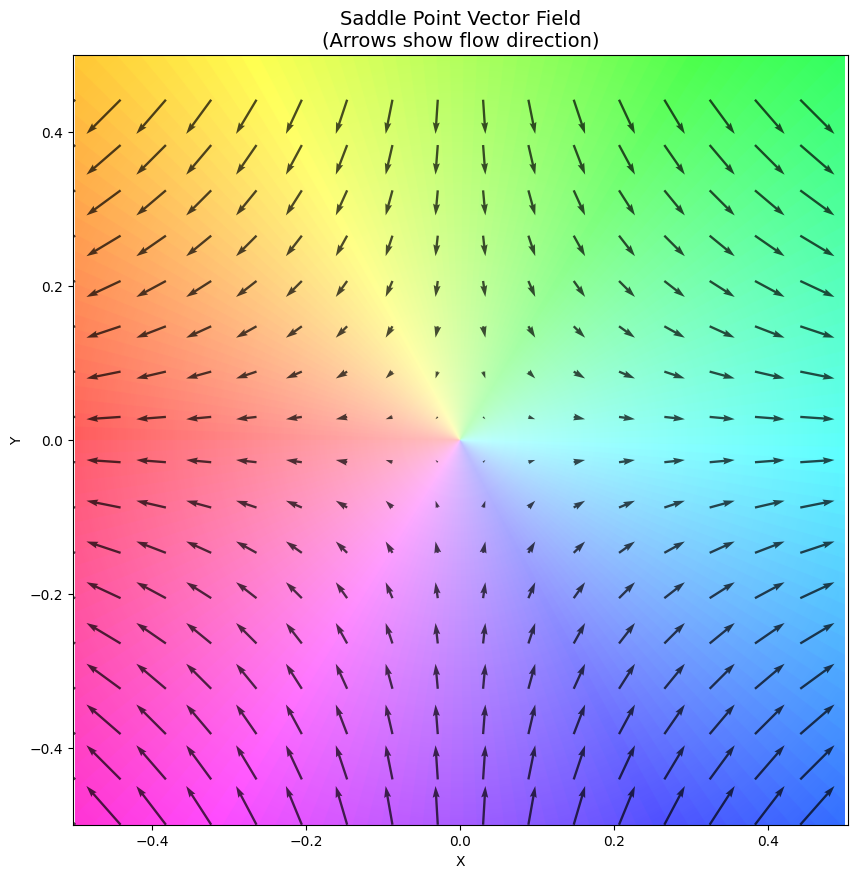

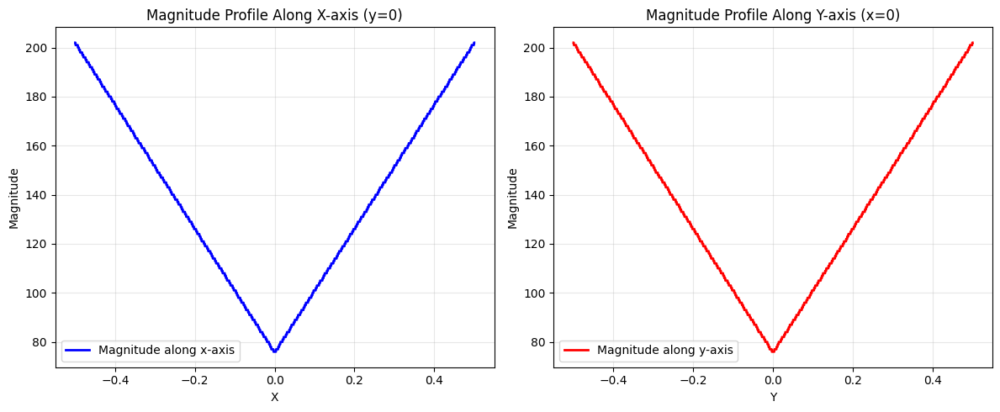

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions


def hyperbolic_saddle_vector_field(x, y, center_x, center_y, strength=1.0, rotation=np.pi/4):
    """
    Create a hyperbolic saddle with optional rotation.
    """
    x_centered = x - center_x
    y_centered = y - center_y
    
    # Apply rotation if specified
    if rotation != 0:
        cos_rot = np.cos(rotation)
        sin_rot = np.sin(rotation)
        x_rot = cos_rot * x_centered - sin_rot * y_centered
        y_rot = sin_rot * x_centered + cos_rot * y_centered
        x_centered, y_centered = x_rot, y_rot
    
    # Hyperbolic saddle equations
    u = strength * x_centered
    v = -strength * y_centered
    
    # Rotate back if needed
    if rotation != 0:
        cos_rot = np.cos(-rotation)
        sin_rot = np.sin(-rotation)
        u_rot = cos_rot * u - sin_rot * v
        v_rot = sin_rot * u + cos_rot * v
        u, v = u_rot, v_rot
    
    return u, v

def calculate_magnitude_direction(u, v):
    """Calculate magnitude and direction of vector field"""
    magnitude = np.sqrt(u**2 + v**2)
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize to 0-1
    return magnitude, direction

# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), 
                   np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the saddle vector field
center_x, center_y = 0.0, 0.0  # Center the saddle at origin
strength = 2.0  # Adjust strength of the saddle

# Choose one of these saddle configurations:
u, v = hyperbolic_saddle_vector_field(x, y, center_x, center_y, strength, rotation=0)

magnitude, direction = calculate_magnitude_direction(u, v)

# Normalize and scale magnitude for visualization
offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue represents direction
img_hsv[:, :, 1] = magnitude_scaled  # Saturation represents magnitude
img_hsv[:, :, 2] = 255  # Full brightness

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Display the HSV visualization
plt.figure(figsize=(5, 5))
#plt.title('Saddle Point - HSV Visualization\n(Hue=Direction, Saturation=Magnitude)', fontsize=14)
#plt.xlabel('X')
#plt.ylabel('Y')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick, -edge_tick, edge_tick])
plt.xticks([-edge_tick, 0, edge_tick])
plt.yticks([-edge_tick, 0, edge_tick])

# Add grid for better visualization
#plt.grid(True, alpha=0.3, color='white')
plt.show()

# Create quiver plot to show vector field
skip = 150
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_downsampled = u[::skip, ::skip]
v_downsampled = v[::skip, ::skip]

plt.figure(figsize=(10, 10))
plt.quiver(X_downsampled, Y_downsampled, u_downsampled, v_downsampled, 
           scale=20, color='black', alpha=0.7, width=0.003)
plt.title('Saddle Point Vector Field\n(Arrows show flow direction)', fontsize=14)
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick, -edge_tick, edge_tick], alpha=0.8)
#plt.grid(True, alpha=0.3, color='white')
plt.axis('equal')

# Plot magnitude profile along center lines
plt.figure(figsize=(12, 5))

# Plot along x-axis (y=0)
center_idx = image_pts // 2
plt.subplot(1, 2, 1)
x_line = np.linspace(-edge_tick, edge_tick, image_pts)
mag_x_line = magnitude_scaled[center_idx, :]
plt.plot(x_line, mag_x_line, 'b-', linewidth=2, label='Magnitude along x-axis')
plt.title('Magnitude Profile Along X-axis (y=0)')
plt.xlabel('X')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
plt.legend()

# Plot along y-axis (x=0)
plt.subplot(1, 2, 2)
y_line = np.linspace(-edge_tick, edge_tick, image_pts)
mag_y_line = magnitude_scaled[:, center_idx]
plt.plot(y_line, mag_y_line, 'r-', linewidth=2, label='Magnitude along y-axis')
plt.title('Magnitude Profile Along Y-axis (x=0)')
plt.xlabel('Y')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()


In [15]:
# =============================================================================
# JACOBIAN ANALYSIS AND CRITICAL POINT PREDICTION
# =============================================================================

# Define analysis point
analysis_x, analysis_y = -0.6, 0.2  # User-defined point

# Calculate u,v at the analysis point
u_point, v_point = hyperbolic_saddle_vector_field(analysis_x, analysis_y, center_x, center_y, strength, rotation=0)

# Calculate Jacobian numerically at the analysis point
h = 1e-6  # Small step for finite differences

# Partial derivatives using finite differences
u_x_plus, _ = hyperbolic_saddle_vector_field(analysis_x + h, analysis_y, center_x, center_y, strength, rotation=0)
u_x_minus, _ = hyperbolic_saddle_vector_field(analysis_x - h, analysis_y, center_x, center_y, strength, rotation=0)
du_dx = (u_x_plus - u_x_minus) / (2 * h)

u_y_plus, _ = hyperbolic_saddle_vector_field(analysis_x, analysis_y + h, center_x, center_y, strength, rotation=0)
u_y_minus, _ = hyperbolic_saddle_vector_field(analysis_x, analysis_y - h, center_x, center_y, strength, rotation=0)
du_dy = (u_y_plus - u_y_minus) / (2 * h)

_, v_x_plus = hyperbolic_saddle_vector_field(analysis_x + h, analysis_y, center_x, center_y, strength, rotation=0)
_, v_x_minus = hyperbolic_saddle_vector_field(analysis_x - h, analysis_y, center_x, center_y, strength, rotation=0)
dv_dx = (v_x_plus - v_x_minus) / (2 * h)

_, v_y_plus = hyperbolic_saddle_vector_field(analysis_x, analysis_y + h, center_x, center_y, strength, rotation=0)
_, v_y_minus = hyperbolic_saddle_vector_field(analysis_x, analysis_y - h, center_x, center_y, strength, rotation=0)
dv_dy = (v_y_plus - v_y_minus) / (2 * h)

# Construct Jacobian matrix
J = np.array([[du_dx, du_dy],
              [dv_dx, dv_dy]])

# Predict critical point using linear approximation
# At critical point: F(x*) = 0
# Linear approximation: F(x) ≈ F(x0) + J(x0)*(x - x0)
# So: 0 ≈ F(x0) + J(x0)*(x* - x0)
# Therefore: x* ≈ x0 - J^(-1) * F(x0)

F_point = np.array([u_point, v_point])

try:
    if np.linalg.det(J) != 0:
        delta = np.linalg.solve(J, F_point)
        predicted_critical = np.array([analysis_x, analysis_y]) - delta
        
        print(f"\n{'='*60}")
        print(f"JACOBIAN ANALYSIS AT POINT ({analysis_x:.3f}, {analysis_y:.3f})")
        print(f"{'='*60}")
        print(f"Vector field at point: u = {u_point:.6f}, v = {v_point:.6f}")
        print(f"Magnitude: {np.sqrt(u_point**2 + v_point**2):.6f}")
        print(f"\nJacobian matrix:")
        print(f"[{J[0,0]:8.6f}  {J[0,1]:8.6f}]")
        print(f"[{J[1,0]:8.6f}  {J[1,1]:8.6f}]")
        print(f"\nEigenvalues: {np.linalg.eigvals(J)[0]:.6f}, {np.linalg.eigvals(J)[1]:.6f}")
        print(f"Determinant: {np.linalg.det(J):.6f}")
        print(f"Trace: {np.trace(J):.6f}")
        print(f"\nPREDICTED CRITICAL POINT: ({predicted_critical[0]:.6f}, {predicted_critical[1]:.6f})")
        print(f"Actual critical point: ({center_x:.6f}, {center_y:.6f})")
        print(f"Prediction error: {np.linalg.norm(predicted_critical - np.array([center_x, center_y])):.6f}")
        
    else:
        print(f"Jacobian is singular (det = 0), cannot predict critical point")
        
except np.linalg.LinAlgError:
    print(f"Error: Jacobian matrix is not invertible")


JACOBIAN ANALYSIS AT POINT (-0.600, 0.200)
Vector field at point: u = -1.200000, v = -0.400000
Magnitude: 1.264911

Jacobian matrix:
[2.000000  0.000000]
[0.000000  -2.000000]

Eigenvalues: 2.000000, -2.000000
Determinant: -4.000000
Trace: 0.000000

PREDICTED CRITICAL POINT: (-0.000000, 0.000000)
Actual critical point: (0.000000, 0.000000)
Prediction error: 0.000000


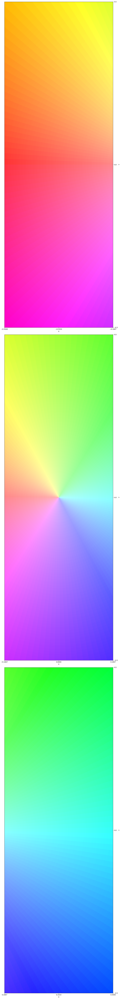

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def hyperbolic_saddle_vector_field(x, y, center_x, center_y, strength=1.0, rotation=np.pi/4):
    """
    Create a hyperbolic saddle with optional rotation.
    """
    x_centered = x - center_x
    y_centered = y - center_y
    
    # Apply rotation if specified
    if rotation != 0:
        cos_rot = np.cos(rotation)
        sin_rot = np.sin(rotation)
        x_rot = cos_rot * x_centered - sin_rot * y_centered
        y_rot = sin_rot * x_centered + cos_rot * y_centered
        x_centered, y_centered = x_rot, y_rot
    
    # Hyperbolic saddle equations
    u = strength * x_centered
    v = -strength * y_centered
    
    # Rotate back if needed
    if rotation != 0:
        cos_rot = np.cos(-rotation)
        sin_rot = np.sin(-rotation)
        u_rot = cos_rot * u - sin_rot * v
        v_rot = sin_rot * u + cos_rot * v
        u, v = u_rot, v_rot
    
    return u, v

def calculate_magnitude_direction(u, v):
    """Calculate magnitude and direction of vector field"""
    magnitude = np.sqrt(u**2 + v**2)
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize to 0-1
    return magnitude, direction

# Create a grid of points
image_pts = 2550
edge_tick = 0.5
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), 
                   np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate the saddle vector field
center_x, center_y = 0.0, 0.0  # Center the saddle at origin
strength = 2.0  # Adjust strength of the saddle

# Choose one of these saddle configurations:
u, v = hyperbolic_saddle_vector_field(x, y, center_x, center_y, strength, rotation=0)

magnitude, direction = calculate_magnitude_direction(u, v)

# Normalize and scale magnitude for visualization
offset = 0.3
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue represents direction
img_hsv[:, :, 1] = magnitude_scaled  # Saturation represents magnitude
img_hsv[:, :, 2] = 255  # Full brightness

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # left third
strip2 = img_rgb[:, strip_width:2*strip_width]  # middle third
strip3 = img_rgb[:, 2*strip_width:]  # right third

# Create figure with three subplots arranged vertically
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (left third: -0.5 to -0.167)
ax1.imshow(strip1, origin='lower', extent=[-edge_tick, -edge_tick/3, -edge_tick, edge_tick])
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.set_xticks([-edge_tick, -edge_tick*2/3, -edge_tick/3])
ax1.set_yticks([-edge_tick, 0, edge_tick])

# Plot strip 2 (middle third: -0.167 to 0.167)
ax2.imshow(strip2, origin='lower', extent=[-edge_tick/3, edge_tick/3, -edge_tick, edge_tick])
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.set_xticks([-edge_tick/3, 0, edge_tick/3])
ax2.set_yticks([-edge_tick, 0, edge_tick])

# Plot strip 3 (right third: 0.167 to 0.5)
ax3.imshow(strip3, origin='lower', extent=[edge_tick/3, edge_tick, -edge_tick, edge_tick])
ax3.set_xlabel('X')
ax3.set_ylabel('Y')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.set_xticks([edge_tick/3, edge_tick*2/3, edge_tick])
ax3.set_yticks([-edge_tick, 0, edge_tick])

plt.tight_layout()
plt.show()

# Heteroclinic Orbit

Computing vector field...
Computing magnitude and direction...


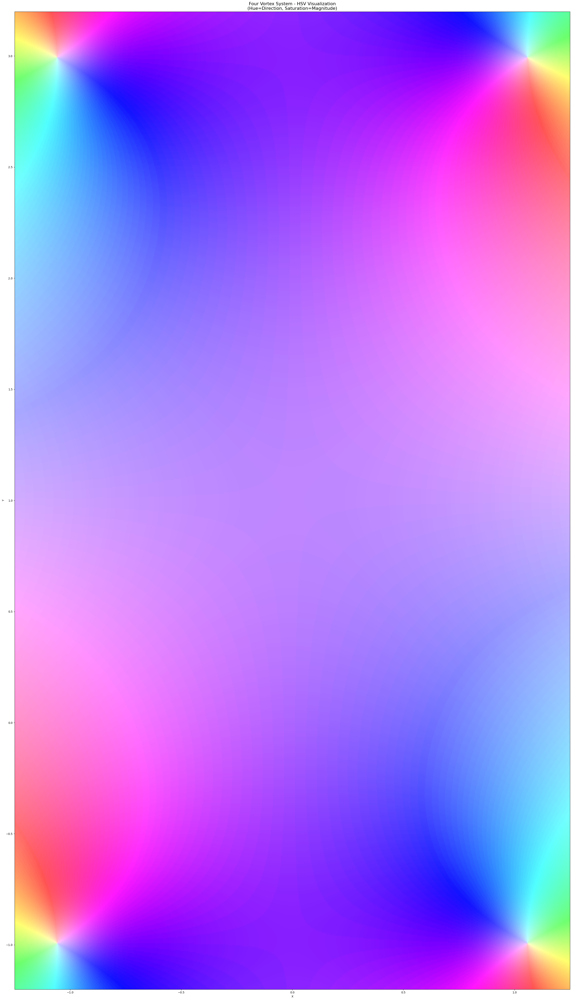

Creating quiver plot...


NameError: name 'vortex_positions' is not defined

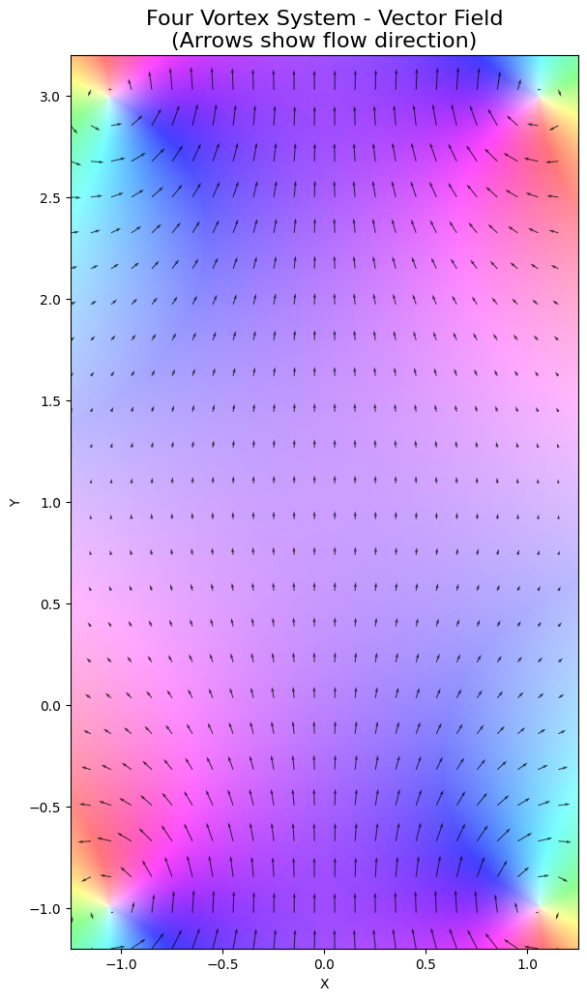

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

class VectorField:
    """Vector field with four vortices in a 2x2 arrangement."""
    
    def __init__(self):
        self.vortex1_pos = np.array([-1, -1])  # Bottom left
        self.vortex2_pos = np.array([1, -1])   # Bottom right
        self.vortex3_pos = np.array([-1, 3])   # Top left
        self.vortex4_pos = np.array([1, 3])    # Top right
        self.source_pos = np.array([4, 0])
        
    def evaluate(self, x, y):
        """Evaluate the vector field at position (x, y)."""
        epsilon = 0.1  # Regularization parameter to avoid singularities
        
        # Define vortex positions and strengths (positive = counterclockwise)
        vortices = [
            (self.vortex1_pos, 1.0),   # Counterclockwise
            (self.vortex2_pos, -1.0),  # Clockwise
            (self.vortex3_pos, 1.0),   # Counterclockwise
            (self.vortex4_pos, -1.0),  # Clockwise
        ]
        
        vx_total = 0
        vy_total = 0
        
        for (xi, yi), strength in vortices:
            dx = x - xi
            dy = y - yi
            r_squared = dx**2 + dy**2 + epsilon
            
            # Vortex velocity field: v = strength * (-dy, dx) / r²
            vx_total += strength * (-dy) / r_squared
            vy_total += strength * dx / r_squared
        
        # Scale factor for visualization
        scale = 1
        return np.array([scale * vx_total, scale * vy_total])
    
    def jacobian_twosided(self, x, y, h=0.01):
        """Compute Jacobian using two-sided finite differences."""
        fx_plus, fy_plus = self.evaluate(x + h, y)
        fx_minus, fy_minus = self.evaluate(x - h, y)
        fx_yplus, fy_yplus = self.evaluate(x, y + h)
        fx_yminus, fy_yminus = self.evaluate(x, y - h)
        
        J = np.array([
            [(fx_plus - fx_minus) / (2*h), (fx_yplus - fx_yminus) / (2*h)],
            [(fy_plus - fy_minus) / (2*h), (fy_yplus - fy_yminus) / (2*h)]
        ])
        return J

def calculate_magnitude_direction(u, v):
    """Calculate magnitude and direction of vector field"""
    magnitude = np.sqrt(u**2 + v**2)
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize to 0-1
    return magnitude, direction



##### MAIN PLOT


# Create vector field instance
vf = VectorField()

# Create a grid of points
image_pts = 1000  # Higher resolution for complex field
x_range = (-1.25, 1.25)  # Wider range to capture all vortices
y_range = (-1.2, 3.2)
x, y = np.meshgrid(np.linspace(x_range[0], x_range[1], image_pts), 
                   np.linspace(y_range[0], y_range[1], image_pts))

# Calculate the vector field at each grid point
print("Computing vector field...")
u = np.zeros_like(x)
v = np.zeros_like(y)

for i in range(image_pts):
    for j in range(image_pts):
        field_val = vf.evaluate(x[i, j], y[i, j])
        u[i, j] = field_val[0]
        v[i, j] = field_val[1]

print("Computing magnitude and direction...")
magnitude, direction = calculate_magnitude_direction(u, v)

# Normalize and scale magnitude for visualization
offset = 0.2  # Lower offset for better contrast
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)





# Create HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue represents direction
img_hsv[:, :, 1] = magnitude_scaled  # Saturation represents magnitude
img_hsv[:, :, 2] = 255  # Full brightness

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Display the HSV visualization
plt.figure(figsize=(30, 50))
plt.title('Four Vortex System - HSV Visualization\n(Hue=Direction, Saturation=Magnitude)', fontsize=16)
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(img_rgb, origin='lower', extent=[x_range[0], x_range[1], y_range[0], y_range[1]])

# # Mark vortex positions
# vortex_positions = [vf.vortex1_pos, vf.vortex2_pos, vf.vortex3_pos, vf.vortex4_pos]
# vortex_labels = ['V1 (CCW)', 'V2 (CW)', 'V3 (CCW)', 'V4 (CW)']
# colors = ['red', 'blue', 'red', 'blue']  # Red for CCW, Blue for CW

# for i, (pos, label, color) in enumerate(zip(vortex_positions, vortex_labels, colors)):
#     plt.plot(pos[0], pos[1], 'o', color=color, markersize=12, markeredgecolor='white', linewidth=2)
#     plt.annotate(label, (pos[0], pos[1]), xytext=(10, 10), textcoords='offset points',
#                 bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
#                 fontsize=10, fontweight='bold')

# plt.grid(True, alpha=0.3, color='white')
plt.tight_layout()
plt.show()












###### OTHER PLOTS

# Create quiver plot to show vector field
print("Creating quiver plot...")
skip = 40  # Adjust for density of arrows
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_downsampled = u[::skip, ::skip]
v_downsampled = v[::skip, ::skip]

plt.figure(figsize=(14, 12))
plt.quiver(X_downsampled, Y_downsampled, u_downsampled, v_downsampled, 
           scale=50, color='black', alpha=0.7, width=0.002)
plt.title('Four Vortex System - Vector Field\n(Arrows show flow direction)', fontsize=16)
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(img_rgb, origin='lower', extent=[x_range[0], x_range[1], y_range[0], y_range[1]], alpha=0.8)

# Mark vortex positions again
for i, (pos, label, color) in enumerate(zip(vortex_positions, vortex_labels, colors)):
    plt.plot(pos[0], pos[1], 'o', color=color, markersize=12, markeredgecolor='white', linewidth=2)

plt.grid(True, alpha=0.3, color='white')
plt.axis('equal')
plt.xlim(x_range)
plt.ylim(y_range)
plt.tight_layout()
plt.show()

# Create magnitude analysis plots
plt.figure(figsize=(15, 5))

# Plot magnitude along horizontal line through center
center_y_idx = image_pts // 2
plt.subplot(1, 3, 1)
x_line = np.linspace(x_range[0], x_range[1], image_pts)
mag_x_line = magnitude[center_y_idx, :]
plt.plot(x_line, mag_x_line, 'b-', linewidth=2)
plt.title('Magnitude Along X-axis (y=1)')
plt.xlabel('X')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
# Mark vortex x-positions
for pos in vortex_positions:
    if abs(pos[1] - 1) < 0.5:  # If vortex is near y=1
        plt.axvline(pos[0], color='red', linestyle='--', alpha=0.7)

# Plot magnitude along vertical line through center
center_x_idx = image_pts // 2
plt.subplot(1, 3, 2)
y_line = np.linspace(y_range[0], y_range[1], image_pts)
mag_y_line = magnitude[:, center_x_idx]
plt.plot(y_line, mag_y_line, 'r-', linewidth=2)
plt.title('Magnitude Along Y-axis (x=1)')
plt.xlabel('Y')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
# Mark vortex y-positions
for pos in vortex_positions:
    if abs(pos[0] - 1) < 0.5:  # If vortex is near x=1
        plt.axvline(pos[1], color='red', linestyle='--', alpha=0.7)

# 3D surface plot of magnitude
plt.subplot(1, 3, 3)
X_3d, Y_3d = np.meshgrid(np.linspace(x_range[0], x_range[1], 50),
                         np.linspace(y_range[0], y_range[1], 50))
magnitude_3d = np.zeros_like(X_3d)
for i in range(50):
    for j in range(50):
        field_val = vf.evaluate(X_3d[i, j], Y_3d[i, j])
        magnitude_3d[i, j] = np.sqrt(field_val[0]**2 + field_val[1]**2)

plt.contour(X_3d, Y_3d, magnitude_3d, levels=20)
plt.colorbar(label='Magnitude')
plt.title('Magnitude Contours')
plt.xlabel('X')
plt.ylabel('Y')
# Mark vortex positions
for pos in vortex_positions:
    plt.plot(pos[0], pos[1], 'ro', markersize=8)

plt.tight_layout()
plt.show()

# =============================================================================
# JACOBIAN ANALYSIS AND CRITICAL POINT PREDICTION
# =============================================================================

# Define analysis point
analysis_x, analysis_y = 0.0, 1.0  # Point between the vortices

print(f"\n{'='*60}")
print(f"JACOBIAN ANALYSIS AT POINT ({analysis_x:.3f}, {analysis_y:.3f})")
print(f"{'='*60}")

# Calculate u,v at the analysis point
field_at_point = vf.evaluate(analysis_x, analysis_y)
u_point, v_point = field_at_point[0], field_at_point[1]

# Calculate Jacobian at the analysis point
J = vf.jacobian_twosided(analysis_x, analysis_y)

print(f"Vector field at point: u = {u_point:.6f}, v = {v_point:.6f}")
print(f"Magnitude: {np.sqrt(u_point**2 + v_point**2):.6f}")
print(f"Direction: {np.arctan2(v_point, u_point):.6f} radians ({np.degrees(np.arctan2(v_point, u_point)):.2f}°)")

print(f"\nJacobian matrix:")
print(f"[{J[0,0]:8.6f}  {J[0,1]:8.6f}]")
print(f"[{J[1,0]:8.6f}  {J[1,1]:8.6f}]")

# Eigenvalue analysis
eigenvals, eigenvecs = np.linalg.eig(J)
print(f"\nEigenvalues: {eigenvals[0]:.6f}, {eigenvals[1]:.6f}")
print(f"Determinant: {np.linalg.det(J):.6f}")
print(f"Trace: {np.trace(J):.6f}")

# Classify critical point type
det_J = np.linalg.det(J)
tr_J = np.trace(J)

if abs(det_J) < 1e-10:
    point_type = "Degenerate"
elif det_J > 0:
    if tr_J < 0:
        point_type = "Stable node/focus"
    else:
        point_type = "Unstable node/focus"
else:  # det_J < 0
    point_type = "Saddle point"

print(f"Local critical point classification: {point_type}")

# Predict critical point using linear approximation
F_point = np.array([u_point, v_point])

try:
    if abs(np.linalg.det(J)) > 1e-10:
        delta = np.linalg.solve(J, F_point)
        predicted_critical = np.array([analysis_x, analysis_y]) - delta
        
        print(f"\nPREDICTED CRITICAL POINT: ({predicted_critical[0]:.6f}, {predicted_critical[1]:.6f})")
        
        # Check if predicted point makes sense (within reasonable bounds)
        if (x_range[0] <= predicted_critical[0] <= x_range[1] and 
            y_range[0] <= predicted_critical[1] <= y_range[1]):
            print(f"Prediction is within field bounds")
            
            # Verify prediction by checking field at predicted point
            field_at_pred = vf.evaluate(predicted_critical[0], predicted_critical[1])
            pred_magnitude = np.sqrt(field_at_pred[0]**2 + field_at_pred[1]**2)
            print(f"Field magnitude at predicted point: {pred_magnitude:.6f}")
        else:
            print(f"Warning: Prediction is outside field bounds")
        
    else:
        print(f"Jacobian is singular (det ≈ 0), cannot predict critical point reliably")
        
except np.linalg.LinAlgError:
    print(f"Error: Jacobian matrix is not invertible")

print(f"\nNote: In a multi-vortex system, there may be multiple critical points")
print(f"including saddle points between vortices. This analysis shows the local")
print(f"linear approximation at the chosen point.")
#print(f"{'='*60"})

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

class VectorField:
    """Vector field with four vortices in a 2x2 arrangement."""
    
    def __init__(self):
        self.vortex1_pos = np.array([-1, -1])  # Bottom left
        self.vortex2_pos = np.array([1, -1])   # Bottom right
        self.vortex3_pos = np.array([-1, 3])   # Top left
        self.vortex4_pos = np.array([1, 3])    # Top right
        self.source_pos = np.array([4, 0])
        
    def evaluate(self, x, y):
        """Evaluate the vector field at position (x, y)."""
        epsilon = 0.1  # Regularization parameter to avoid singularities
        
        # Define vortex positions and strengths (positive = counterclockwise)
        vortices = [
            (self.vortex1_pos, 1.0),   # Counterclockwise
            (self.vortex2_pos, -1.0),  # Clockwise
            (self.vortex3_pos, 1.0),   # Counterclockwise
            (self.vortex4_pos, -1.0),  # Clockwise
        ]
        
        vx_total = 0
        vy_total = 0
        
        for (xi, yi), strength in vortices:
            dx = x - xi
            dy = y - yi
            r_squared = dx**2 + dy**2 + epsilon
            
            # Vortex velocity field: v = strength * (-dy, dx) / r²
            vx_total += strength * (-dy) / r_squared
            vy_total += strength * dx / r_squared
        
        # Scale factor for visualization
        scale = 1.0
        return np.array([scale * vx_total, scale * vy_total])
    
    def jacobian_twosided(self, x, y, h=0.01):
        """Compute Jacobian using two-sided finite differences."""
        fx_plus, fy_plus = self.evaluate(x + h, y)
        fx_minus, fy_minus = self.evaluate(x - h, y)
        fx_yplus, fy_yplus = self.evaluate(x, y + h)
        fx_yminus, fy_yminus = self.evaluate(x, y - h)
        
        J = np.array([
            [(fx_plus - fx_minus) / (2*h), (fx_yplus - fx_yminus) / (2*h)],
            [(fy_plus - fy_minus) / (2*h), (fy_yplus - fy_yminus) / (2*h)]
        ])
        return J

def calculate_magnitude_direction(u, v):
    """Calculate magnitude and direction of vector field"""
    magnitude = np.sqrt(u**2 + v**2)
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize to 0-1
    return magnitude, direction

# Create vector field instance
vf = VectorField()

# Create a grid of points
image_pts = 300  # Higher resolution for complex field
x_range = (-3, 5)  # Wider range to capture all vortices
y_range = (-3, 5)
x, y = np.meshgrid(np.linspace(x_range[0], x_range[1], image_pts), 
                   np.linspace(y_range[0], y_range[1], image_pts))

# Calculate the vector field at each grid point
print("Computing vector field...")
u = np.zeros_like(x)
v = np.zeros_like(y)

for i in range(image_pts):
    for j in range(image_pts):
        field_val = vf.evaluate(x[i, j], y[i, j])
        u[i, j] = field_val[0]
        v[i, j] = field_val[1]

print("Computing magnitude and direction...")
magnitude, direction = calculate_magnitude_direction(u, v)

# Normalize and scale magnitude for visualization
offset = 0.2  # Lower offset for better contrast
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue represents direction
img_hsv[:, :, 1] = magnitude_scaled  # Saturation represents magnitude
img_hsv[:, :, 2] = 255  # Full brightness

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Display the HSV visualization
plt.figure(figsize=(14, 12))
plt.title('Four Vortex System - HSV Visualization\n(Hue=Direction, Saturation=Magnitude)', fontsize=16)
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(img_rgb, origin='lower', extent=[x_range[0], x_range[1], y_range[0], y_range[1]])

# Mark vortex positions
vortex_positions = [vf.vortex1_pos, vf.vortex2_pos, vf.vortex3_pos, vf.vortex4_pos]
vortex_labels = ['V1 (CCW)', 'V2 (CW)', 'V3 (CCW)', 'V4 (CW)']
colors = ['red', 'blue', 'red', 'blue']  # Red for CCW, Blue for CW

for i, (pos, label, color) in enumerate(zip(vortex_positions, vortex_labels, colors)):
    plt.plot(pos[0], pos[1], 'o', color=color, markersize=12, markeredgecolor='white', linewidth=2)
    plt.annotate(label, (pos[0], pos[1]), xytext=(10, 10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                fontsize=10, fontweight='bold')

plt.grid(True, alpha=0.3, color='white')
plt.tight_layout()
plt.show()

# Create quiver plot to show vector field
print("Creating quiver plot...")
skip = 12  # Adjust for density of arrows
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_downsampled = u[::skip, ::skip]
v_downsampled = v[::skip, ::skip]

plt.figure(figsize=(14, 12))
plt.quiver(X_downsampled, Y_downsampled, u_downsampled, v_downsampled, 
           scale=50, color='black', alpha=0.7, width=0.002)
plt.title('Four Vortex System - Vector Field\n(Arrows show flow direction)', fontsize=16)
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(img_rgb, origin='lower', extent=[x_range[0], x_range[1], y_range[0], y_range[1]], alpha=0.8)

# Mark vortex positions again
for i, (pos, label, color) in enumerate(zip(vortex_positions, vortex_labels, colors)):
    plt.plot(pos[0], pos[1], 'o', color=color, markersize=12, markeredgecolor='white', linewidth=2)

plt.grid(True, alpha=0.3, color='white')
plt.axis('equal')
plt.xlim(x_range)
plt.ylim(y_range)
plt.tight_layout()
plt.show()

# Create magnitude analysis plots
plt.figure(figsize=(15, 5))

# Plot magnitude along horizontal line through center
center_y_idx = image_pts // 2
plt.subplot(1, 3, 1)
x_line = np.linspace(x_range[0], x_range[1], image_pts)
mag_x_line = magnitude[center_y_idx, :]
plt.plot(x_line, mag_x_line, 'b-', linewidth=2)
plt.title('Magnitude Along X-axis (y=1)')
plt.xlabel('X')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
# Mark vortex x-positions
for pos in vortex_positions:
    if abs(pos[1] - 1) < 0.5:  # If vortex is near y=1
        plt.axvline(pos[0], color='red', linestyle='--', alpha=0.7)

# Plot magnitude along vertical line through center
center_x_idx = image_pts // 2
plt.subplot(1, 3, 2)
y_line = np.linspace(y_range[0], y_range[1], image_pts)
mag_y_line = magnitude[:, center_x_idx]
plt.plot(y_line, mag_y_line, 'r-', linewidth=2)
plt.title('Magnitude Along Y-axis (x=1)')
plt.xlabel('Y')
plt.ylabel('Magnitude')
plt.grid(True, alpha=0.3)
# Mark vortex y-positions
for pos in vortex_positions:
    if abs(pos[0] - 1) < 0.5:  # If vortex is near x=1
        plt.axvline(pos[1], color='red', linestyle='--', alpha=0.7)

# 3D surface plot of magnitude
plt.subplot(1, 3, 3)
X_3d, Y_3d = np.meshgrid(np.linspace(x_range[0], x_range[1], 50),
                         np.linspace(y_range[0], y_range[1], 50))
magnitude_3d = np.zeros_like(X_3d)
for i in range(50):
    for j in range(50):
        field_val = vf.evaluate(X_3d[i, j], Y_3d[i, j])
        magnitude_3d[i, j] = np.sqrt(field_val[0]**2 + field_val[1]**2)

plt.contour(X_3d, Y_3d, magnitude_3d, levels=20)
plt.colorbar(label='Magnitude')
plt.title('Magnitude Contours')
plt.xlabel('X')
plt.ylabel('Y')
# Mark vortex positions
for pos in vortex_positions:
    plt.plot(pos[0], pos[1], 'ro', markersize=8)

plt.tight_layout()
plt.show()

# =============================================================================
# JACOBIAN ANALYSIS AND CRITICAL POINT PREDICTION
# =============================================================================

# Define analysis point
analysis_x, analysis_y = 0.0, 1.0  # Point between the vortices

print(f"\n{'='*60}")
print(f"JACOBIAN ANALYSIS AT POINT ({analysis_x:.3f}, {analysis_y:.3f})")
print(f"{'='*60}")

# Calculate u,v at the analysis point
field_at_point = vf.evaluate(analysis_x, analysis_y)
u_point, v_point = field_at_point[0], field_at_point[1]

# Calculate Jacobian at the analysis point
J = vf.jacobian_twosided(analysis_x, analysis_y)

print(f"Vector field at point: u = {u_point:.6f}, v = {v_point:.6f}")
print(f"Magnitude: {np.sqrt(u_point**2 + v_point**2):.6f}")
print(f"Direction: {np.arctan2(v_point, u_point):.6f} radians ({np.degrees(np.arctan2(v_point, u_point)):.2f}°)")

print(f"\nJacobian matrix:")
print(f"[{J[0,0]:8.6f}  {J[0,1]:8.6f}]")
print(f"[{J[1,0]:8.6f}  {J[1,1]:8.6f}]")

# Eigenvalue analysis
eigenvals, eigenvecs = np.linalg.eig(J)
print(f"\nEigenvalues: {eigenvals[0]:.6f}, {eigenvals[1]:.6f}")
print(f"Determinant: {np.linalg.det(J):.6f}")
print(f"Trace: {np.trace(J):.6f}")

# Classify critical point type
det_J = np.linalg.det(J)
tr_J = np.trace(J)

if abs(det_J) < 1e-10:
    point_type = "Degenerate"
elif det_J > 0:
    if tr_J < 0:
        point_type = "Stable node/focus"
    else:
        point_type = "Unstable node/focus"
else:  # det_J < 0
    point_type = "Saddle point"

print(f"Local critical point classification: {point_type}")

# Predict critical point using linear approximation
F_point = np.array([u_point, v_point])

try:
    if abs(np.linalg.det(J)) > 1e-10:
        delta = np.linalg.solve(J, F_point)
        predicted_critical = np.array([analysis_x, analysis_y]) - delta
        
        print(f"\nPREDICTED CRITICAL POINT: ({predicted_critical[0]:.6f}, {predicted_critical[1]:.6f})")
        
        # Check if predicted point makes sense (within reasonable bounds)
        if (x_range[0] <= predicted_critical[0] <= x_range[1] and 
            y_range[0] <= predicted_critical[1] <= y_range[1]):
            print(f"Prediction is within field bounds")
            
            # Verify prediction by checking field at predicted point
            field_at_pred = vf.evaluate(predicted_critical[0], predicted_critical[1])
            pred_magnitude = np.sqrt(field_at_pred[0]**2 + field_at_pred[1]**2)
            print(f"Field magnitude at predicted point: {pred_magnitude:.6f}")
        else:
            print(f"Warning: Prediction is outside field bounds")
        
    else:
        print(f"Jacobian is singular (det ≈ 0), cannot predict critical point reliably")
        
except np.linalg.LinAlgError:
    print(f"Error: Jacobian matrix is not invertible")

print(f"\nNote: In a multi-vortex system, there may be multiple critical points")
print(f"including saddle points between vortices. This analysis shows the local")
print(f"linear approximation at the chosen point.")
#print(f"{'='*60"})

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def hyperbolic_saddle_vector_field(x, y, center_x, center_y, strength=1.0, rotation=0):
    """
    Create a hyperbolic saddle with optional rotation.
    """
    x_centered = x - center_x
    y_centered = y - center_y
    
    # Apply rotation if specified
    if rotation != 0:
        cos_rot = np.cos(rotation)
        sin_rot = np.sin(rotation)
        x_rot = cos_rot * x_centered - sin_rot * y_centered
        y_rot = sin_rot * x_centered + cos_rot * y_centered
        x_centered, y_centered = x_rot, y_rot
    
    # Hyperbolic saddle equations
    u = strength * x_centered
    v = -strength * y_centered
    
    # Rotate back if needed
    if rotation != 0:
        cos_rot = np.cos(-rotation)
        sin_rot = np.sin(-rotation)
        u_rot = cos_rot * u - sin_rot * v
        v_rot = sin_rot * u + cos_rot * v
        u, v = u_rot, v_rot
    
    return u, v

def two_saddle_system(x, y, saddle1_pos, saddle2_pos, strength1=1.0, strength2=1.0, 
                      rotation1=0, rotation2=0, coupling=0.1):
    """
    Create a system with two saddle points that can generate heteroclinic orbits.
    """
    # Get individual saddle contributions
    u1, v1 = hyperbolic_saddle_vector_field(x, y, saddle1_pos[0], saddle1_pos[1], 
                                           strength1, rotation1)
    u2, v2 = hyperbolic_saddle_vector_field(x, y, saddle2_pos[0], saddle2_pos[1], 
                                           strength2, rotation2)
    
    # Distance-based weighting for smooth blending
    d1 = np.sqrt((x - saddle1_pos[0])**2 + (y - saddle1_pos[1])**2) + 0.01
    d2 = np.sqrt((x - saddle2_pos[0])**2 + (y - saddle2_pos[1])**2) + 0.01
    
    # Inverse distance weighting with falloff
    w1 = 1.0 / (d1**2 + coupling)
    w2 = 1.0 / (d2**2 + coupling)
    
    # Combine the fields
    total_weight = w1 + w2
    u_combined = (u1 * w1 + u2 * w2) / total_weight
    v_combined = (v1 * w1 + v2 * w2) / total_weight
    
    return u_combined, v_combined

def calculate_magnitude_direction(u, v):
    """Calculate magnitude and direction of vector field"""
    magnitude = np.sqrt(u**2 + v**2)
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize to 0-1
    return magnitude, direction

def integrate_trajectory(start_x, start_y, field_func, dt=0.001, max_steps=50000, 
                        bounds=(-2, 2, -2, 2)):
    """
    Integrate a trajectory through the vector field using Runge-Kutta 4th order.
    """
    trajectory = [(start_x, start_y)]
    x, y = start_x, start_y
    
    for step in range(max_steps):
        # RK4 integration
        k1_u, k1_v = field_func(x, y)
        k2_u, k2_v = field_func(x + dt*k1_u/2, y + dt*k1_v/2)
        k3_u, k3_v = field_func(x + dt*k2_u/2, y + dt*k2_v/2)
        k4_u, k4_v = field_func(x + dt*k3_u, y + dt*k3_v)
        
        dx = dt * (k1_u + 2*k2_u + 2*k3_u + k4_u) / 6
        dy = dt * (k1_v + 2*k2_v + 2*k3_v + k4_v) / 6
        
        x += dx
        y += dy
        
        # Check bounds
        if x < bounds[0] or x > bounds[1] or y < bounds[2] or y > bounds[3]:
            break
            
        # Check for very slow motion (near equilibrium)
        speed = np.sqrt(dx**2 + dy**2)
        if speed < 1e-8:
            break
            
        trajectory.append((x, y))
        
        # Stop if trajectory gets too long (memory considerations)
        if len(trajectory) > 100000:
            break
    
    return np.array(trajectory)

# System parameters
image_pts = 1500  # High resolution for detailed visualization
edge_tick = 2.0   # Larger domain to see heteroclinic connections

# Define saddle positions for heteroclinic orbit
# Classic configuration: saddles on opposite corners with specific orientations
saddle1_pos = np.array([-1.0, -1])  # Left saddle
saddle2_pos = np.array([1.0, 1])    # Right saddle

# Saddle parameters - these are crucial for heteroclinic orbits
strength1 = 1.0
strength2 = 1.0
rotation1 = np.pi/4   # 45 degrees
rotation2 = -np.pi/4  # -45 degrees
coupling = 0.5        # Controls interaction strength

print("Creating two-saddle system for heteroclinic orbits...")
print(f"Saddle 1: position {saddle1_pos}, rotation {rotation1:.3f} rad ({np.degrees(rotation1):.1f}°)")
print(f"Saddle 2: position {saddle2_pos}, rotation {rotation2:.3f} rad ({np.degrees(rotation2):.1f}°)")

# Create grid
x, y = np.meshgrid(np.linspace(-edge_tick, edge_tick, image_pts), 
                   np.linspace(-edge_tick, edge_tick, image_pts))

# Calculate combined vector field
u, v = two_saddle_system(x, y, saddle1_pos, saddle2_pos, strength1, strength2, 
                        rotation1, rotation2, coupling)

magnitude, direction = calculate_magnitude_direction(u, v)

# Normalize and scale magnitude for visualization
offset = 0.2  # Lower offset for better contrast in complex field
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue represents direction
img_hsv[:, :, 1] = magnitude_scaled  # Saturation represents magnitude
img_hsv[:, :, 2] = 255  # Full brightness

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Display the main HSV visualization
plt.figure(figsize=(20, 20))
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True, 
                top=False, labeltop=False, bottom=True, labelbottom=True)
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick, -edge_tick, edge_tick])
plt.xticks([-edge_tick, -edge_tick/2, 0, edge_tick/2, edge_tick])
plt.yticks([-edge_tick, -edge_tick/2, 0, edge_tick/2, edge_tick])

# Mark saddle points
plt.plot(saddle1_pos[0], saddle1_pos[1], 'wo', markersize=15, markeredgecolor='black', linewidth=3)
plt.plot(saddle2_pos[0], saddle2_pos[1], 'wo', markersize=15, markeredgecolor='black', linewidth=3)
plt.annotate('S1', saddle1_pos, xytext=(-20, -20), textcoords='offset points',
            fontsize=16, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7))
plt.annotate('S2', saddle2_pos, xytext=(10, 10), textcoords='offset points',
            fontsize=16, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7))

plt.show()

# Create vector field overlay
skip = 75  # Adjust for arrow density
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_downsampled = u[::skip, ::skip]
v_downsampled = v[::skip, ::skip]

plt.figure(figsize=(15, 15))
plt.quiver(X_downsampled, Y_downsampled, u_downsampled, v_downsampled, 
           scale=30, color='black', alpha=0.8, width=0.003)
plt.title('Two Saddle System - Vector Field\n(Arrows show flow direction)', fontsize=16)
plt.xlabel('X', fontsize=14)
plt.ylabel('Y', fontsize=14)
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick, -edge_tick, edge_tick], alpha=0.7)

# Mark saddle points
plt.plot(saddle1_pos[0], saddle1_pos[1], 'ro', markersize=12, markeredgecolor='white', linewidth=2)
plt.plot(saddle2_pos[0], saddle2_pos[1], 'ro', markersize=12, markeredgecolor='white', linewidth=2)
plt.axis('equal')
plt.xlim(-edge_tick, edge_tick)
plt.ylim(-edge_tick, edge_tick)
plt.grid(True, alpha=0.3, color='white')
plt.show()

# Compute and visualize potential heteroclinic trajectories
print("Computing heteroclinic trajectories...")

# Create field function for trajectory integration
def field_func(x_val, y_val):
    return two_saddle_system(x_val, y_val, saddle1_pos, saddle2_pos, strength1, strength2, 
                           rotation1, rotation2, coupling)

# Strategic starting points for heteroclinic trajectories
# These are educated guesses along the unstable manifolds of the saddles
heteroclinic_starts = [
    # From saddle 1 unstable manifold
    (saddle1_pos[0] + 0.1, saddle1_pos[1] + 0.1),
    (saddle1_pos[0] - 0.1, saddle1_pos[1] - 0.1),
    (saddle1_pos[0] + 0.05, saddle1_pos[1] - 0.05),
    (saddle1_pos[0] - 0.05, saddle1_pos[1] + 0.05),
    
    # From saddle 2 unstable manifold  
    (saddle2_pos[0] + 0.1, saddle2_pos[1] + 0.1),
    (saddle2_pos[0] - 0.1, saddle2_pos[1] - 0.1),
    (saddle2_pos[0] + 0.05, saddle2_pos[1] - 0.05),
    (saddle2_pos[0] - 0.05, saddle2_pos[1] + 0.05),
    
    # Additional strategic points
    (0, 0), (0.5, 0), (-0.5, 0), (0, 0.5), (0, -0.5),
    (1.5, 0), (-1.5, 0), (0, 1.5), (0, -1.5)
]

# Integrate trajectories
trajectories = []
for start_x, start_y in heteroclinic_starts:
    # Forward integration
    traj_forward = integrate_trajectory(start_x, start_y, field_func, dt=0.001, max_steps=30000)
    # Backward integration (reverse field)
    def reverse_field(x_val, y_val):
        u_val, v_val = field_func(x_val, y_val)
        return -u_val, -v_val
    traj_backward = integrate_trajectory(start_x, start_y, reverse_field, dt=0.001, max_steps=30000)
    
    # Combine trajectories (backward first, then forward)
    if len(traj_backward) > 1 and len(traj_forward) > 1:
        combined_traj = np.vstack([traj_backward[::-1], traj_forward[1:]])
        trajectories.append(combined_traj)

# Plot trajectories over the field
plt.figure(figsize=(16, 16))
plt.imshow(img_rgb, origin='lower', extent=[-edge_tick, edge_tick, -edge_tick, edge_tick], alpha=0.8)

# Plot trajectories
colors = plt.cm.Set3(np.linspace(0, 1, len(trajectories)))
for i, traj in enumerate(trajectories):
    if len(traj) > 10:  # Only plot substantial trajectories
        plt.plot(traj[:, 0], traj[:, 1], color=colors[i], linewidth=2.5, alpha=0.9)
        # Mark start point
        plt.plot(traj[0, 0], traj[0, 1], 'o', color=colors[i], markersize=6, 
                markeredgecolor='white', markeredgewidth=1)

# Mark saddle points
plt.plot(saddle1_pos[0], saddle1_pos[1], 'ks', markersize=15, markeredgecolor='white', linewidth=3)
plt.plot(saddle2_pos[0], saddle2_pos[1], 'ks', markersize=15, markeredgecolor='white', linewidth=3)

plt.title('Two Saddle System with Potential Heteroclinic Orbits', fontsize=18)
plt.xlabel('X', fontsize=14)
plt.ylabel('Y', fontsize=14)
plt.axis('equal')
plt.xlim(-edge_tick, edge_tick)
plt.ylim(-edge_tick, edge_tick)
plt.grid(True, alpha=0.3, color='white')

# Add legend
plt.text(-1.8, 1.7, 'Heteroclinic\nTrajectories', fontsize=14, 
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9))
plt.text(-1.8, -1.9, f'S1: ({saddle1_pos[0]:.1f}, {saddle1_pos[1]:.1f})\nS2: ({saddle2_pos[0]:.1f}, {saddle2_pos[1]:.1f})', 
         fontsize=12, bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9))

plt.tight_layout()
plt.show()

print(f"\nHeteroclinic Orbit Analysis:")
print(f"- Generated {len(trajectories)} trajectory candidates")
print(f"- Look for trajectories that connect the two saddle points")
print(f"- Heteroclinic orbits appear as smooth curves connecting S1 and S2")
print(f"- Adjust saddle positions, rotations, and coupling for different patterns")

# Analysis: Find potential heteroclinic connections
print(f"\nTrajectory Analysis:")
for i, traj in enumerate(trajectories):
    if len(traj) > 1000:  # Long trajectories are candidates
        start_dist_s1 = np.linalg.norm(traj[0] - saddle1_pos)
        start_dist_s2 = np.linalg.norm(traj[0] - saddle2_pos)
        end_dist_s1 = np.linalg.norm(traj[-1] - saddle1_pos)
        end_dist_s2 = np.linalg.norm(traj[-1] - saddle2_pos)
        
        # Check if trajectory connects saddles (within tolerance)
        tolerance = 0.3
        if ((start_dist_s1 < tolerance and end_dist_s2 < tolerance) or 
            (start_dist_s2 < tolerance and end_dist_s1 < tolerance)):
            print(f"  Trajectory {i}: POTENTIAL HETEROCLINIC ORBIT (length: {len(traj)})")
        elif len(traj) > 5000:
            print(f"  Trajectory {i}: Long orbit (length: {len(traj)})")

print(f"\nTip: Fine-tune saddle positions and rotations to create clean heteroclinic connections!")
print(f"Current configuration: rotation1={np.degrees(rotation1):.1f}°, rotation2={np.degrees(rotation2):.1f}°")

# Shorter Range Vortex

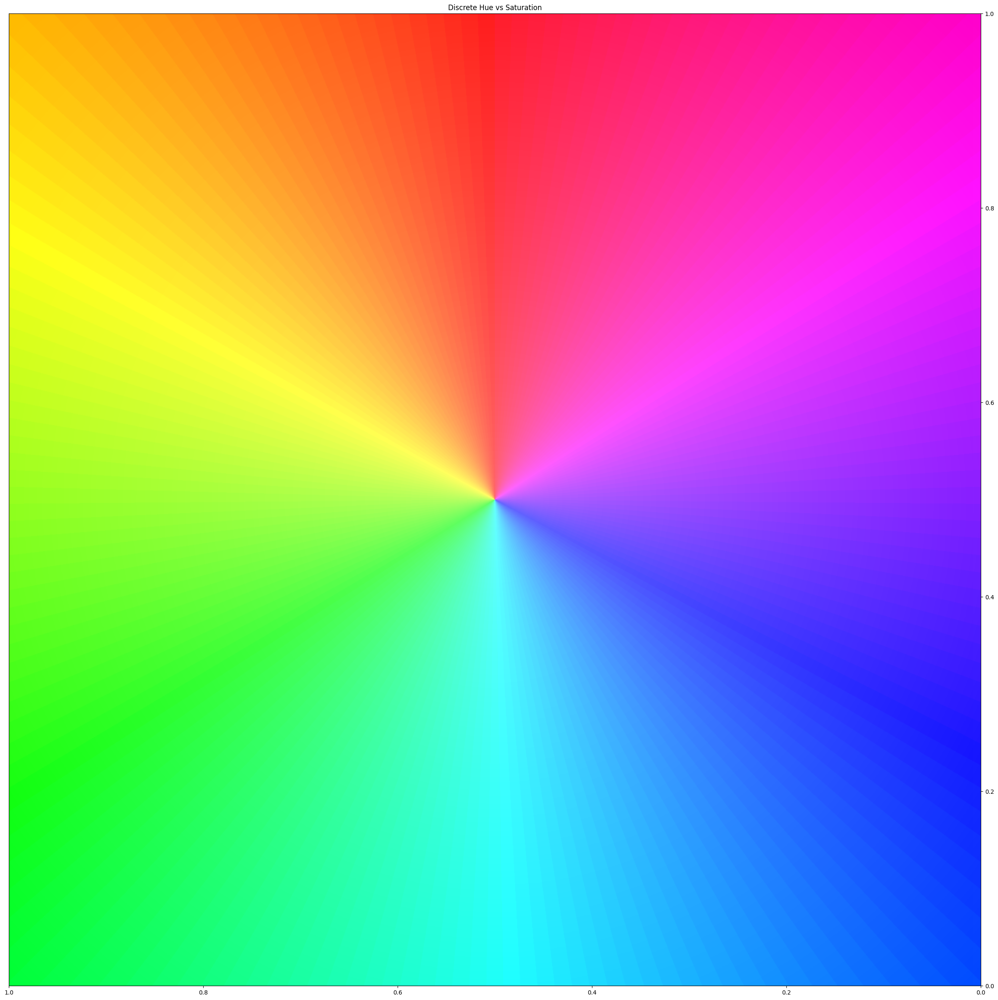

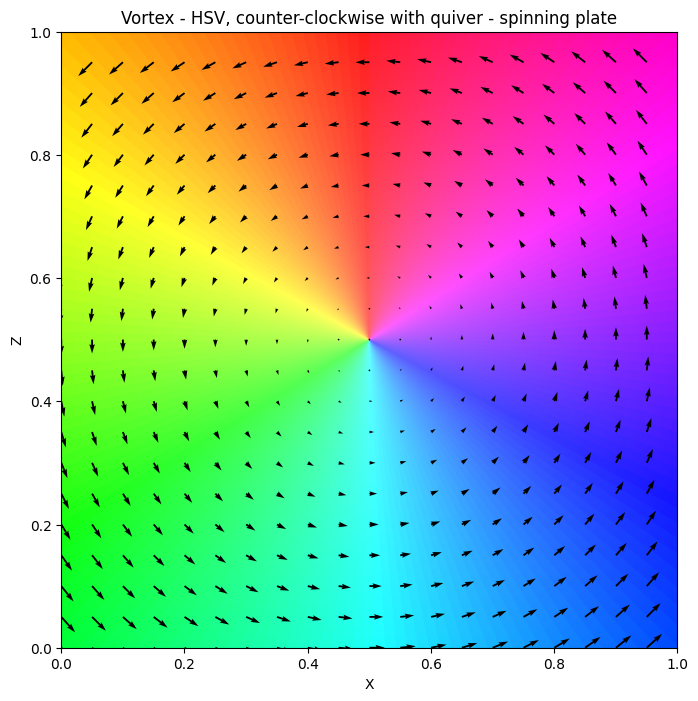

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define Helper Functions

def vortex_vector_field(x, y, center_x, center_y):
    # Calculate radius and angle
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2) + 1e-10  # small epsilon to prevent divide-by-zero
    theta = np.arctan2(y - center_y, x - center_x)
    
    # Adjusting field components to create a "spinning plate" effect
    u = -r * np.sin(theta) #/ r
    v = r * np.cos(theta) #/ r
    return u, v

def calculate_magnitude_direction(u, v):
    # Calculate magnitude and direction
    magnitude = np.sqrt(u**2 + v**2)  # Magnitude
    direction = (np.arctan2(v, u) + np.pi) / (2 * np.pi)  # Normalize direction to 0-1
    return magnitude, direction


# Create a grid of points
image_pts = 2000
x, y = np.meshgrid(np.linspace(0, 1, image_pts), np.linspace(0, 1, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.50, 0.50
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.6
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)



# Display the resulting image
plt.figure(figsize=(30, 30))
plt.title('Discrete Hue vs Saturation')
#plt.xlabel('X')
#plt.ylabel('Z')
#plt.title('Vortex - HSV, counter-clockwise - spinning plate')
plt.gca().yaxis.set_label_position('right')
plt.gca().xaxis.set_label_position('bottom')
plt.tick_params(left=False, labelleft=False, right=True, labelright=True)
plt.gca().invert_xaxis() 
plt.imshow(img_rgb, origin='lower', extent=[1, 0, 0, 1])
#plt.xticks([0, 1/3, 2/3, 1]) 






# Plot the quiver plot
# Invert the x-axis
max_val = 2  # Adjust as needed
u_clipped = np.clip(magnitude * np.cos(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
v_clipped = np.clip(magnitude * np.sin(direction * 2 * np.pi), -max_val, max_val)  # Use magnitude and direction
skip = 100
X_downsampled = x[::skip, ::skip]
Y_downsampled = y[::skip, ::skip]
u_clipped_downsampled = u_clipped[::skip, ::skip]
v_clipped_downsampled = v_clipped[::skip, ::skip]

plt.figure(figsize=(8, 8))

plt.quiver(X_downsampled, Y_downsampled, -u_clipped_downsampled, -v_clipped_downsampled, scale=20, color='black')
plt.title('Discrete Hue vs Saturation')
plt.xlabel('X')
plt.ylabel('Z')
plt.title('Vortex - HSV, counter-clockwise with quiver - spinning plate')
# Invert the x-axis
plt.imshow(img_rgb, origin='lower', extent=[0, 1, 0, 1])





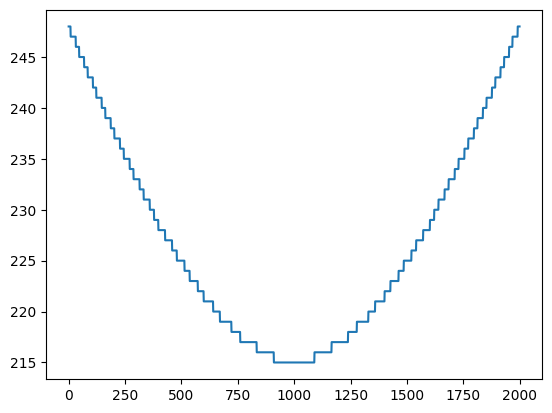

In [10]:
plt.plot(magnitude_scaled[:][128])


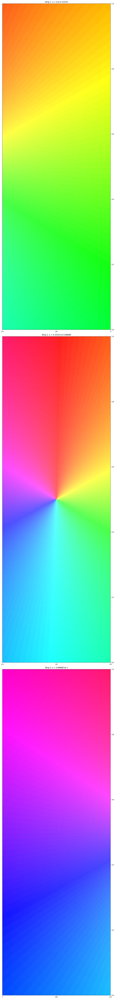

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2


# Create a grid of points
image_pts = 4000
x, y = np.meshgrid(np.linspace(0, 1, image_pts), np.linspace(0, 1, image_pts))

# Calculate the vector field and magnitude and direction at each point
center_x, center_y = 0.50, 0.50
u, v = vortex_vector_field(x, y, center_x, center_y)
magnitude, direction = calculate_magnitude_direction(u, v)

offset = 0.6
magnitude_normalized = ((magnitude - np.min(magnitude)) / (np.max(magnitude) - np.min(magnitude)) * 255).astype(np.uint8)
magnitude_scaled = (((magnitude_normalized/255)*(1-offset) + offset)*255).astype(np.uint8)
direction_scaled = np.clip(direction * 179, 0, 179).astype(np.uint8)

# Create an HSV image
img_hsv = np.zeros((image_pts, image_pts, 3), dtype=np.uint8)
img_hsv[:, :, 0] = direction_scaled  # Hue channel represents direction
img_hsv[:, :, 1] =  magnitude_scaled # Saturation channel represents magnitude
img_hsv[:, :, 2] = 255  # Set Value to maximum

img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Split the image into three strips
strip_width = image_pts // 3
strip1 = img_rgb[:, :strip_width]  # 0 to 0.33333
strip2 = img_rgb[:, strip_width:2*strip_width]  # 0.33333 to 0.66666
strip3 = img_rgb[:, 2*strip_width:]  # 0.66666 to 1

# Create figure with three subplots arranged vertically (height = 3x width)
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 90))

# Plot strip 1 (0 - 0.33333)
ax1.imshow(strip1, origin='lower', extent=[1/3, 0, 0, 1])
ax1.set_title('Strip 1: x = 0 to 0.33333')
ax1.yaxis.set_label_position('right')
ax1.xaxis.set_label_position('bottom')
ax1.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax1.invert_xaxis()

# Plot strip 2 (0.33333 - 0.66666)
ax2.imshow(strip2, origin='lower', extent=[2/3, 1/3, 0, 1])
ax2.set_title('Strip 2: x = 0.33333 to 0.66666')
ax2.yaxis.set_label_position('right')
ax2.xaxis.set_label_position('bottom')
ax2.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax2.invert_xaxis()

# Plot strip 3 (0.66666 - 1)
ax3.imshow(strip3, origin='lower', extent=[1, 2/3, 0, 1])
ax3.set_title('Strip 3: x = 0.66666 to 1')
ax3.yaxis.set_label_position('right')
ax3.xaxis.set_label_position('bottom')
ax3.tick_params(left=False, labelleft=False, right=True, labelright=True)
ax3.invert_xaxis()

# For ax1:
ax1.set_xticks([0, 1/6, 1/3])
ax1.set_xticklabels(['1/3', '1/6', '0'])

# For ax2:
ax2.set_xticks([1/3, 1/2, 2/3])
ax2.set_xticklabels(['2/3', '1/2', '1/3'])

# For ax3:
ax3.set_xticks([2/3, 5/6, 1])
ax3.set_xticklabels(['1', '5/6', '2/3'])


plt.tight_layout()
plt.show()

